<a id="1"></a>
# <div style="text-align:center; border-radius:15px 50px; padding:7px; color:white; margin:0; font-size:110%; font-family:Pacifico; background-color:#0073e6; overflow:hidden"><b> Machine learning - NLP Analysis Reviews</b></div>

![](https://img.freepik.com/fotos-gratis/render-smartphone-trend-plataforma-de-midias-sociais_1409-5845.jpg?t=st=1726004752~exp=1726008352~hmac=1369c0afaeac2b4bad2bff021171fd68326618fc90bf451209d4a32ecdc4108f&w=740)

# Part 1 - Business Problem Classifying Topics in Amazon Product Reviews

**Objective:** Amazon has a large volume of customer reviews for various products. These reviews contain valuable information about customer experiences, which can be useful for improving product search and providing better recommendations. However, the massive volume of data makes it challenging to manually extract the main topics from the reviews. The goal is to create a Topic Modeling model that automatically identifies and classifies the main topics within the product reviews.

**Project Objectives:**
1. **Dataset Exploration and Data Cleaning:**
   - Remove null and inconsistent values.
   - Check for duplicates in the data.
   - Perform text preprocessing, such as removing stopwords, tokenization, and applying stemming or lemmatization.

2. **Topic Modeling:**
   - Apply *Topic Modeling* techniques such as *Latent Dirichlet Allocation (LDA)* or *Non-Negative Matrix Factorization (NMF)* to identify the main topics in the reviews.
   - Test different numbers of topics and evaluate the quality of the identified topics.
   - Identify the most representative words for each topic.

3. **Topic Classification:**
   - Once the topics are identified, classify the reviews into different categories to facilitate search.

4. **Evaluation:**
   - Assess the coherence of the generated topics using topic coherence metrics.
   - Interpret and label the topics meaningfully to improve visualization and search.

5. **Results and Impact:**
   - Provide a set of categories or topics that help users quickly filter reviews based on discussed themes (product quality, shipping, customer support, etc.).
   - Implement the model in a way that it can be applied to new data automatically.

**Success Indicators:**
- Topic coherence (using topic coherence metrics).
- Quality of the review categorization.
- Ease of navigation through the generated topics.

In [1]:
# Installing packages
!pip install watermark
!pip install vaderSentiment
!pip install imbalanced-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 3.2 MB/s eta 0:00:00


In [2]:
# Import of libraries

# System libraries
import re
import unicodedata
import itertools
from datasets import Dataset

# Library for file manipulation
import pandas as pd
import numpy as np
import pandas

# Data visualization
import seaborn as sns
import matplotlib.pylab as pl
import matplotlib as m
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import pyplot as plt

# ML NLP
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

### Download the necessary resources from nltk (tokenizers and stopwords corpus)
# Punkt tokenizer for word tokenization
nltk.download('punkt')

# Stopwords list in multiple languages
nltk.download('stopwords') 

# Configuration for graph width and layout
sns.set_theme(style='whitegrid')
palette='viridis'

# Warnings remove alerts
import warnings
warnings.filterwarnings("ignore")

# Python version
from platform import python_version
print('Python version in this Jupyter Notebook:', python_version())

# Load library versions
import watermark

# Library versions
%reload_ext watermark
%watermark -a "Library versions" --iversions

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
Python version in this Jupyter Notebook: 3.10.14
Author: Library versions

nltk      : 3.2.4
plotly    : 5.22.0
pandas    : 2.2.2
seaborn   : 0.12.2
watermark : 2.4.3
numpy     : 1.26.4
re        : 2.2.1
matplotlib: 3.7.5



# Part 2 - Database

In [3]:
# Database
pd.set_option('display.max_columns', None)
df = pd.read_csv("/kaggle/input/amazon-product-reviews-dataset/7817_1.csv")

# Viewing dataset
df.head()

,id,asins,brand,categories,colors,dateAdded,dateUpdated,dimension,ean,keys,manufacturer,manufacturerNumber,name,prices,reviews.date,reviews.doRecommend,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sizes,upc,weight
0,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-08-08T00:00:00.000Z,NaN,139.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I initially had trouble deciding between the p...,"Paperwhite voyage, no regrets!",NaN,NaN,Cristina M,NaN,NaN,205 grams
1,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-09-01T00:00:00.000Z,NaN,126.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,Allow me to preface this with a little history...,One Simply Could Not Ask For More,NaN,NaN,Ricky,NaN,NaN,205 grams
2,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-07-20T00:00:00.000Z,NaN,69.0,4.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I am enjoying it so far. Great for reading. Ha...,Great for those that just want an e-reader,NaN,NaN,Tedd Gardiner,NaN,NaN,205 grams
3,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2017-06-16T00:00:00.000Z,NaN,2.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I bought one of the first Paperwhites and have...,Love / Hate relationship,NaN,NaN,Dougal,NaN,NaN,205 grams
4,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2016-08-11T00:00:00.000Z,NaN,17.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I have to say upfront - I don't like coroporat...,I LOVE IT,NaN,NaN,Miljan David Tanic,NaN,NaN,205 grams


In [4]:
# Viewing first 5 data
df.head()

,id,asins,brand,categories,colors,dateAdded,dateUpdated,dimension,ean,keys,manufacturer,manufacturerNumber,name,prices,reviews.date,reviews.doRecommend,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sizes,upc,weight
0,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-08-08T00:00:00.000Z,NaN,139.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I initially had trouble deciding between the p...,"Paperwhite voyage, no regrets!",NaN,NaN,Cristina M,NaN,NaN,205 grams
1,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-09-01T00:00:00.000Z,NaN,126.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,Allow me to preface this with a little history...,One Simply Could Not Ask For More,NaN,NaN,Ricky,NaN,NaN,205 grams
2,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-07-20T00:00:00.000Z,NaN,69.0,4.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I am enjoying it so far. Great for reading. Ha...,Great for those that just want an e-reader,NaN,NaN,Tedd Gardiner,NaN,NaN,205 grams
3,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2017-06-16T00:00:00.000Z,NaN,2.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I bought one of the first Paperwhites and have...,Love / Hate relationship,NaN,NaN,Dougal,NaN,NaN,205 grams
4,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2016-08-11T00:00:00.000Z,NaN,17.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I have to say upfront - I don't like coroporat...,I LOVE IT,NaN,NaN,Miljan David Tanic,NaN,NaN,205 grams


In [5]:
# Viewing 5 latest data
df.tail()

,id,asins,brand,categories,colors,dateAdded,dateUpdated,dimension,ean,keys,manufacturer,manufacturerNumber,name,prices,reviews.date,reviews.doRecommend,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sizes,upc,weight
1592,AVpfo9ukilAPnD_xfhuj,B00NO8JJZW,Amazon,"Amazon Devices & Accessories,Amazon Device Acc...",NaN,2016-04-02T14:40:43Z,2017-08-13T08:28:46Z,NaN,NaN,alexavoiceremoteforamazonfiretvfiretvstick/b00...,NaN,DR49WK,Alexa Voice Remote for Amazon Fire TV and Fire...,"[{""amountMax"":29.99,""amountMin"":29.99,""currenc...",2016-07-06T00:00:00.000Z,NaN,9.0,3.0,https://www.amazon.com/Alexa-Voice-Remote-Amaz...,This is not the same remote that I got for my ...,I would be disappointed with myself if i produ...,NaN,NaN,GregAmandawith4,NaN,NaN,4 ounces
1593,AVpfo9ukilAPnD_xfhuj,B00NO8JJZW,Amazon,"Amazon Devices & Accessories,Amazon Device Acc...",NaN,2016-04-02T14:40:43Z,2017-08-13T08:28:46Z,NaN,NaN,alexavoiceremoteforamazonfiretvfiretvstick/b00...,NaN,DR49WK,Alexa Voice Remote for Amazon Fire TV and Fire...,"[{""amountMax"":29.99,""amountMin"":29.99,""currenc...",2016-06-22T00:00:00.000Z,NaN,41.0,1.0,https://www.amazon.com/Alexa-Voice-Remote-Amaz...,I have had to change the batteries in this rem...,Battery draining remote!!!!,NaN,NaN,Amazon Customer,NaN,NaN,4 ounces
1594,AVpfo9ukilAPnD_xfhuj,B00NO8JJZW,Amazon,"Amazon Devices & Accessories,Amazon Device Acc...",NaN,2016-04-02T14:40:43Z,2017-08-13T08:28:46Z,NaN,NaN,alexavoiceremoteforamazonfiretvfiretvstick/b00...,NaN,DR49WK,Alexa Voice Remote for Amazon Fire TV and Fire...,"[{""amountMax"":29.99,""amountMin"":29.99,""currenc...",2016-03-31T00:00:00.000Z,NaN,34.0,1.0,https://www.amazon.com/Alexa-Voice-Remote-Amaz...,"Remote did not activate, nor did it connect to...",replacing an even worse remote. Waste of time,NaN,NaN,Amazon Customer,NaN,NaN,4 ounces
1595,AVpfo9ukilAPnD_xfhuj,B00NO8JJZW,Amazon,"Amazon Devices & Accessories,Amazon Device Acc...",NaN,2016-04-02T14:40:43Z,2017-08-13T08:28:46Z,NaN,NaN,alexavoiceremoteforamazonfiretvfiretvstick/b00...,NaN,DR49WK,Alexa Voice Remote for Amazon Fire TV and Fire...,"[{""amountMax"":29.99,""amountMin"":29.99,""currenc...",2016-04-26T00:00:00Z,NaN,7.0,3.0,https://www.amazon.com/Alexa-Voice-Remote-Amaz...,It does the job but is super over priced. I fe...,Overpriced,NaN,NaN,Meg Ashley,NaN,NaN,4 ounces
1596,AVpfo9ukilAPnD_xfhuj,B00NO8JJZW,Amazon,"Amazon Devices & Accessories,Amazon Device Acc...",NaN,2016-04-02T14:40:43Z,2017-08-13T08:28:46Z,NaN,NaN,alexavoiceremoteforamazonfiretvfiretvstick/b00...,NaN,DR49WK,Alexa Voice Remote for Amazon Fire TV and Fire...,"[{""amountMax"":29.99,""amountMin"":29.99,""currenc...",2016-07-31T00:00:00Z,NaN,10.0,1.0,https://www.amazon.com/Alexa-Voice-Remote-Amaz...,I ordered this item to replace the one that no...,I am sending all of this crap back to amazon a...,NaN,NaN,DIANE K,NaN,NaN,4 ounces


In [6]:
# Info data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1597 entries, 0 to 1596
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    1597 non-null   object 
 1   asins                 1597 non-null   object 
 2   brand                 1597 non-null   object 
 3   categories            1597 non-null   object 
 4   colors                774 non-null    object 
 5   dateAdded             1597 non-null   object 
 6   dateUpdated           1597 non-null   object 
 7   dimension             565 non-null    object 
 8   ean                   898 non-null    float64
 9   keys                  1597 non-null   object 
 10  manufacturer          965 non-null    object 
 11  manufacturerNumber    902 non-null    object 
 12  name                  1597 non-null   object 
 13  prices                1597 non-null   object 
 14  reviews.date          1217 non-null   object 
 15  reviews.doRecommend  

In [7]:
# Type data
df.dtypes

id                       object
asins                    object
brand                    object
categories               object
colors                   object
dateAdded                object
dateUpdated              object
dimension                object
ean                     float64
keys                     object
manufacturer             object
manufacturerNumber       object
name                     object
prices                   object
reviews.date             object
reviews.doRecommend      object
reviews.numHelpful      float64
reviews.rating          float64
reviews.sourceURLs       object
reviews.text             object
reviews.title            object
reviews.userCity        float64
reviews.userProvince    float64
reviews.username         object
sizes                   float64
upc                     float64
weight                   object
dtype: object

In [8]:
# Viewing rows and columns
df.shape

(1597, 27)

In [9]:
# Copy data
data = df.copy()

# Part 3 - Data cleaning

In [10]:
print("Checking for missing values in each column:")
print(df.isnull().sum())

Checking for missing values in each column:
id                         0
asins                      0
brand                      0
categories                 0
colors                   823
dateAdded                  0
dateUpdated                0
dimension               1032
ean                      699
keys                       0
manufacturer             632
manufacturerNumber       695
name                       0
prices                     0
reviews.date             380
reviews.doRecommend     1058
reviews.numHelpful       697
reviews.rating           420
reviews.sourceURLs         0
reviews.text               0
reviews.title             17
reviews.userCity        1597
reviews.userProvince    1597
reviews.username          17
sizes                   1597
upc                      699
weight                   911
dtype: int64


In [11]:
# Remove columns that have any NaN value
df = df.dropna(axis=1)

# Check remaining columns after removal
print("Remaining columns after removing columns with NaN:")
print(df.isnull().sum())

Remaining columns after removing columns with NaN:
id                    0
asins                 0
brand                 0
categories            0
dateAdded             0
dateUpdated           0
keys                  0
name                  0
prices                0
reviews.sourceURLs    0
reviews.text          0
dtype: int64


In [12]:
# Calculate the total number of rows and the number of missing values in the 'Translated_Review' column.
# Then, print the percentage of missing values in the 'Translated_Review' column.
#total_rows = len(df)
#missing_translated_review = df['reviews.title'].isnull().sum()
#print(f"Percentage of missing Translated_Review: {(missing_translated_review/total_rows)*100:.2f}%")

In [13]:
# Drop rows that have missing values in the 'Translated_Review' or 'Sentiment' columns
#df = df.dropna(subset=['reviews.title'])

# Print the count of missing values for each column after dropping the rows with missing data
#print(df.isnull().sum())
#print()

# Display the DataFrame
#df

# Part 4 - Text Preprocessing

In [14]:
%%time

import re
import string
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

### Download the necessary resources from nltk (tokenizers and stopwords corpus)
# Punkt tokenizer for word tokenization
nltk.download('punkt')
 
# Stopwords list in multiple languages
nltk.download('stopwords')   

# Initialize the Porter stemmer and load English stopwords
stemmer = PorterStemmer()

# Create a set of English stopwords for efficient lookup
stop_words = set(stopwords.words('english'))  

# Function to clean the text by removing URLs, handles, and punctuation
def clean_text(text):
    if isinstance(text, str):
        # Convert text to lowercase
        text = text.lower()

        # Remove URLs (http, https, and www links)
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

        # Remove markdown-style links [text](link)
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)

        # Remove handles (@username mentions)
        text = re.sub(r'@\w+', '', text)

        # Remove punctuation and special characters
        text = text.translate(str.maketrans('', '', string.punctuation))

        return text
    else:
        return text

# Function to tokenize the text into individual words
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text

# Function to remove stopwords from the tokenized text
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        return [word for word in tokens if word not in stop_words]
    else:
        return tokens

# Function to apply stemming to the tokens
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

### Apply the functions to the DataFrame
# Clean the text
df['Cleaned_Review'] = df['reviews.text'].apply(clean_text)

# Tokenize the cleaned text
df['Tokenized_Review'] = df['Cleaned_Review'].apply(tokenize_text)

# Apply stemming to the tokenized words
df['Stemmed_Review'] = df['Tokenized_Review'].apply(stem_tokens)  

# Remove stopwords from the tokenized text
df['No_Stopwords_Review'] = df['Tokenized_Review'].apply(remove_stopwords)

# Display the first few rows of the DataFrame to visualize the dataset
df.head()

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
CPU times: user 8.89 s, sys: 22.5 ms, total: 8.91 s
Wall time: 8.91 s


,id,asins,brand,categories,dateAdded,dateUpdated,keys,name,prices,reviews.sourceURLs,reviews.text,Cleaned_Review,Tokenized_Review,Stemmed_Review,No_Stopwords_Review
0,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,kindlepaperwhite/b00qjdu3ky,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",https://www.amazon.com/Kindle-Paperwhite-High-...,I initially had trouble deciding between the p...,i initially had trouble deciding between the p...,"[i, initially, had, trouble, deciding, between...","[i, initi, had, troubl, decid, between, the, p...","[initially, trouble, deciding, paperwhite, voy..."
1,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,kindlepaperwhite/b00qjdu3ky,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",https://www.amazon.com/Kindle-Paperwhite-High-...,Allow me to preface this with a little history...,allow me to preface this with a little history...,"[allow, me, to, preface, this, with, a, little...","[allow, me, to, prefac, thi, with, a, littl, h...","[allow, preface, little, history, casual, read..."
2,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,kindlepaperwhite/b00qjdu3ky,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",https://www.amazon.com/Kindle-Paperwhite-High-...,I am enjoying it so far. Great for reading. Ha...,i am enjoying it so far great for reading had ...,"[i, am, enjoying, it, so, far, great, for, rea...","[i, am, enjoy, it, so, far, great, for, read, ...","[enjoying, far, great, reading, original, fire..."
3,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,kindlepaperwhite/b00qjdu3ky,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",https://www.amazon.com/Kindle-Paperwhite-High-...,I bought one of the first Paperwhites and have...,i bought one of the first paperwhites and have...,"[i, bought, one, of, the, first, paperwhites, ...","[i, bought, one, of, the, first, paperwhit, an...","[bought, one, first, paperwhites, pleased, con..."
4,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,kindlepaperwhite/b00qjdu3ky,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",https://www.amazon.com/Kindle-Paperwhite-High-...,I have to say upfront - I don't like coroporat...,i have to say upfront i dont like coroporate ...,"[i, have, to, say, upfront, i, dont, like, cor...","[i, have, to, say, upfront, i, dont, like, cor...","[say, upfront, dont, like, coroporate, hermeti..."


Here, we performed text preprocessing, which included several important steps. First, we carried out **text cleaning**, removing special characters such as punctuation, symbols, and irrelevant numbers to ensure that the model would not be influenced by noise. Additionally, we standardized the text by applying techniques such as converting to lowercase and removing extra spaces.

The second part of the preprocessing involved **text tokenization**, where the content was segmented into individual words (tokens). This step is crucial for further analysis, allowing each word to be handled separately rather than treating the text as a single block. Tokenization also facilitates the conversion of words into numerical representations, a necessary step for training machine learning and deep learning models.

If needed, other preprocessing techniques can be applied, such as removing stopwords (common words that add little meaning, like "the", "and", "of"), stemming or lemmatization (reducing words to their root forms), and the creation of n-grams to capture word combinations.

# Part 4.1 - Sentiment Analysis with Vader

In [15]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Create an instance of SentimentIntensityAnalyzer, which is part of the VADER sentiment analysis tool.
analyzer = SentimentIntensityAnalyzer()

# Function to apply VADER sentiment analysis to each review.
# The function takes in a 'review' (text) and returns the polarity scores, which include
# 'compound', 'positive', 'negative', and 'neutral' sentiment values.
def get_sentiment(review):
    return analyzer.polarity_scores(review)

# Apply the 'get_sentiment' function to each entry in the 'Cleaned_Review' column.
# Store the resulting sentiment scores (dictionary) in a new column 'vader_scores'.
df['vader_scores'] = df['Cleaned_Review'].apply(get_sentiment)

# Extract the 'compound' score from the 'vader_scores' dictionary for each review.
# The 'compound' score is a normalized score ranging from -1 (most negative) to +1 (most positive),
# summarizing the overall sentiment of the text.
df['compound'] = df['vader_scores'].apply(lambda score_dict: score_dict['compound'])

# Function to classify the sentiment based on the 'compound' score.
# Scores >= 0.05 are classified as 'Positive', <= -0.05 as 'Negative', and anything in between as 'Neutral'.
def classify_sentiment(compound_score):
    if compound_score >= 0.05:
        return 'Positive'
    elif compound_score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Apply the 'classify_sentiment' function to the 'compound' score to get the overall sentiment
# classification (Positive, Negative, or Neutral) for each review.
df['sentiment'] = df['compound'].apply(classify_sentiment)

# Display the first few rows of the DataFrame, showing the cleaned review text,
# the 'compound' sentiment score, and the classified 'sentiment'.
print(df[['Cleaned_Review', 'compound', 'sentiment']].head(10))

                                      Cleaned_Review  compound sentiment
0  i initially had trouble deciding between the p...    0.9879  Positive
1  allow me to preface this with a little history...    0.9881  Positive
2  i am enjoying it so far great for reading had ...    0.4364  Positive
3  i bought one of the first paperwhites and have...    0.9746  Positive
4  i have to say upfront  i dont like coroporate ...    0.9980  Positive
5  my previous kindle was a dx this is my second ...    0.2627  Positive
6  allow me to preface this with a little history...    0.9881  Positive
7  just got mine right now looks the same as the ...    0.9205  Positive
8  i initially had trouble deciding between the p...    0.9879  Positive
9  i am enjoying it so far great for reading had ...    0.4364  Positive


In this script, we apply the VADER (Valence Aware Dictionary and sEntiment Reasoner) sentiment analysis tool to classify the sentiment of textual reviews. VADER is a popular rule-based model used to analyze the sentiment expressed in text, specifically designed to handle social media, but applicable to any type of textual data.

- **Sentiment Analysis with VADER**: We start by initializing an instance of `SentimentIntensityAnalyzer`, which computes the polarity of a given text. VADER calculates four sentiment scores for each review: `positive`, `negative`, `neutral`, and a `compound` score. The `compound` score represents an overall sentiment, normalized between -1 (extremely negative) to +1 (extremely positive).

- **Extracting the Compound Score**: After applying VADER to each review in the `Cleaned_Review` column, we store the results in a new column `vader_scores`. From this dictionary, we specifically extract the `compound` score, which simplifies the task of classifying the overall sentiment into 'Positive', 'Negative', or 'Neutral' based on defined thresholds.

- **Classifying Sentiments**: The `classify_sentiment` function uses the `compound` score to categorize the sentiment. A score greater than or equal to 0.05 indicates a positive sentiment, a score less than or equal to -0.05 indicates a negative sentiment, and anything in between is considered neutral. This classification helps in understanding the emotional tone conveyed in the review text.

- **Final Output**: After applying the sentiment classification, the DataFrame now contains columns for the original cleaned review text, the `compound` score, and the final `sentiment` label. This allows for easy interpretation of both the numerical sentiment scores and their respective categories (Positive, Neutral, or Negative). We then display the first few entries to visualize the results.

Overall, this script demonstrates a simple and effective way to perform sentiment analysis on text data using VADER, allowing for automated categorization of emotional tone in customer reviews, feedback, or any other form of written text."

# Part 5 - Exploratory data analysis

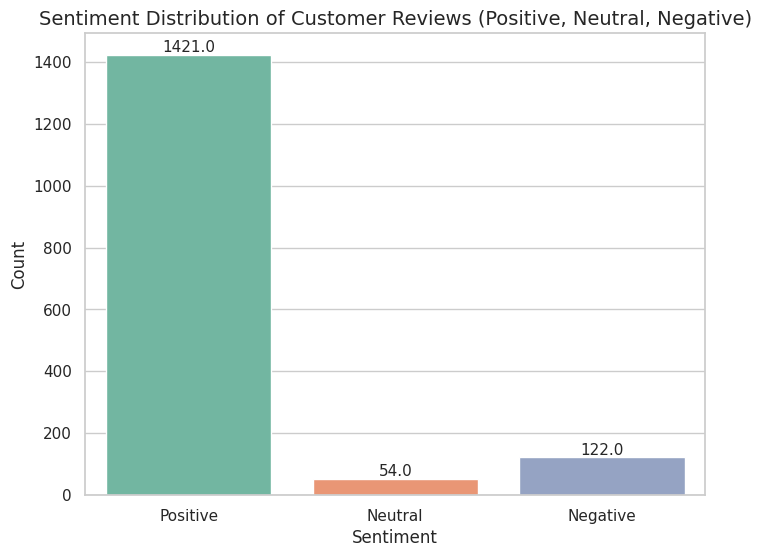

In [16]:
# Assuming df is already loaded and contains the 'sentiment' column
plt.figure(figsize=(8, 6))

# Count plot with a specific color palette
sns.countplot(data=df, x='sentiment', palette='Set2')

# Add title and axis labels with adjusted font sizes
plt.title('Sentiment Distribution of Customer Reviews (Positive, Neutral, Negative)', fontsize=14)
plt.xlabel('Sentiment', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Adding data labels on top of the bars
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), 
                       ha='center', va='bottom', fontsize=11)

# Display the plot
plt.show()

**Analysis** 

1. **Positive Sentiment Dominance**: - The overwhelming majority of reviews are classified as **Positive** (1,421 counts). This suggests that customers are generally satisfied or expressing favorable opinions in the reviews.

2. **Neutral Sentiment**: - There is a significantly lower number of reviews classified as **Neutral** (54 counts). This means that few reviews are neither strongly positive nor negative, showing a lack of middle-ground feedback.

3. **Negative Sentiment**: - A small portion of reviews is classified as **Negative** (122 counts). While fewer than positive reviews, this indicates that some customers are sharing dissatisfaction or negative experiences.

4. **Visual Representation**: - The **bar plot** clearly highlights the disproportionate distribution of sentiments, where **positive reviews far outnumber** both negative and neutral sentiments.
 - **Labeling** is well done, with the exact count numbers annotated on top of each bar, allowing for easy understanding of the data.

5. **Improvements in Balance**: - If the dataset aims to represent a balanced sentiment analysis, it might be necessary to gather or balance more negative or neutral reviews to avoid the positive sentiment dominance. Alternatively, such an imbalance could be a reflection of a generally positive customer experience.

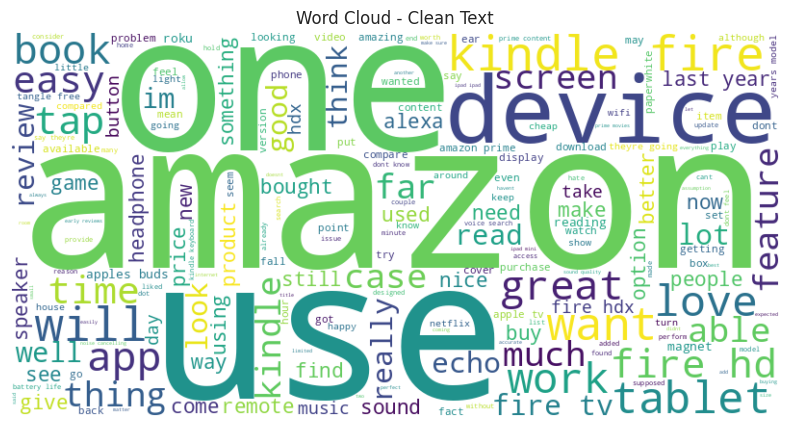

In [17]:
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400, 
                      background_color='white').generate(' '.join(df['Cleaned_Review'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud - Clean Text")
plt.show()

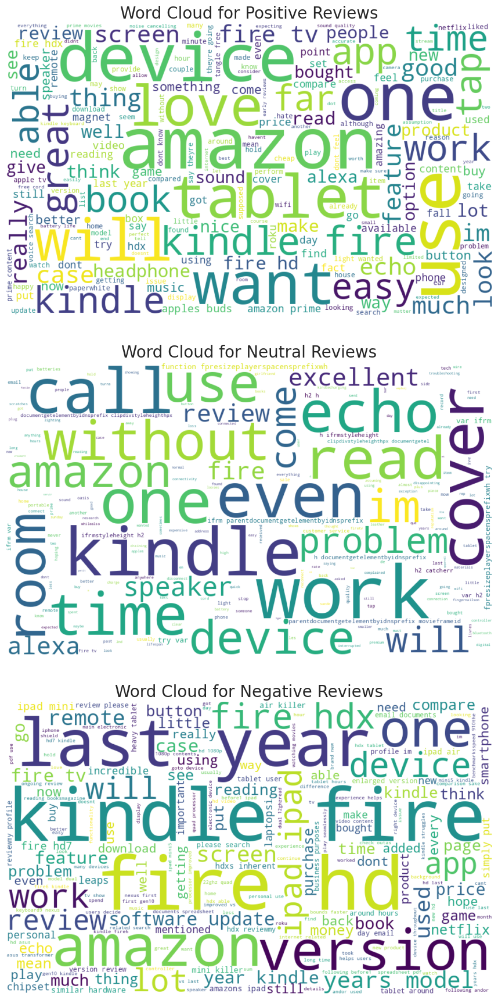

In [18]:
# Separate reviews based on sentiment
positive_reviews = " ".join(df[df['sentiment'] == 'Positive']['Cleaned_Review'].tolist())
neutral_reviews = " ".join(df[df['sentiment'] == 'Neutral']['Cleaned_Review'].tolist())
negative_reviews = " ".join(df[df['sentiment'] == 'Negative']['Cleaned_Review'].tolist())

# Generate word clouds with larger dimensions and font size
wordcloud_positive = WordCloud(width=1000, height=600, background_color='white', max_font_size=150).generate(positive_reviews)
wordcloud_neutral = WordCloud(width=1000, height=600, background_color='white', max_font_size=150).generate(neutral_reviews)
wordcloud_negative = WordCloud(width=1000, height=600, background_color='white', max_font_size=150).generate(negative_reviews)

# Plot the word clouds for each sentiment with larger figure size
plt.figure(figsize=(10, 18))

# Positive word cloud
plt.subplot(3, 1, 1)
plt.imshow(wordcloud_positive, interpolation='bilinear')
plt.title('Word Cloud for Positive Reviews', fontsize=20)
plt.axis('off')

# Neutral word cloud
plt.subplot(3, 1, 2)
plt.imshow(wordcloud_neutral, interpolation='bilinear')
plt.title('Word Cloud for Neutral Reviews', fontsize=20)
plt.axis('off')

# Negative word cloud
plt.subplot(3, 1, 3)
plt.imshow(wordcloud_negative, interpolation='bilinear')
plt.title('Word Cloud for Negative Reviews', fontsize=20)
plt.axis('off')

# Show the word clouds
plt.tight_layout(pad=3)
plt.show()

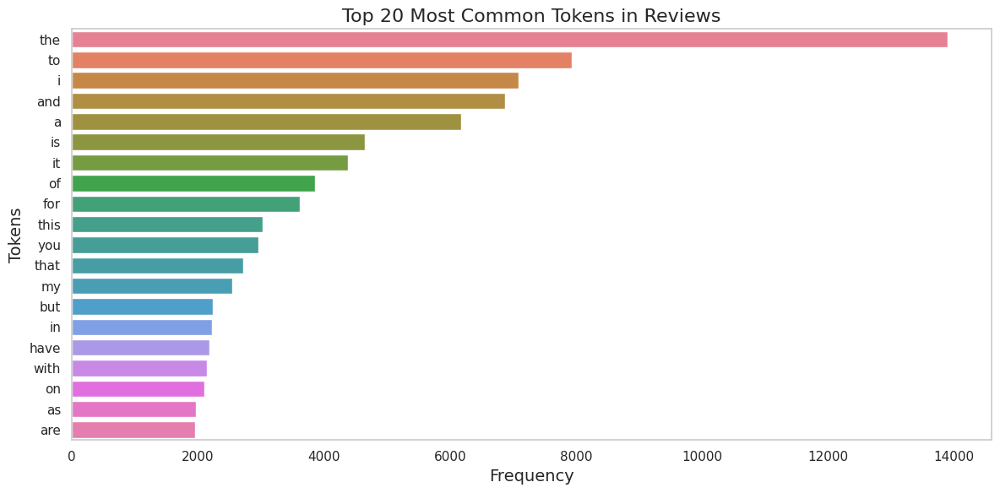

In [19]:
from collections import Counter

# Combine all tokens into a single list
all_tokens = [token for tokens in df['Tokenized_Review'] for token in tokens]

# Count the frequency of tokens
token_counts = Counter(all_tokens)

# Get the top 20 most common tokens
common_tokens = token_counts.most_common(20)  # Limiting to top 20

# Separate tokens and their frequencies
tokens, frequencies = zip(*common_tokens)

# Create a bar plot for the most frequent tokens
plt.figure(figsize=(12, 6))
sns.barplot(x=list(frequencies), y=list(tokens), palette='husl')  # Changed palette

# Improved title and axis labels
plt.title('Top 20 Most Common Tokens in Reviews', fontsize=16)
plt.xlabel('Frequency', fontsize=14)
plt.ylabel('Tokens', fontsize=14)

# Add gridlines for easier reading of bar heights
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()  # Ensure layout is clean and labels fit well
plt.grid(False)
plt.show()

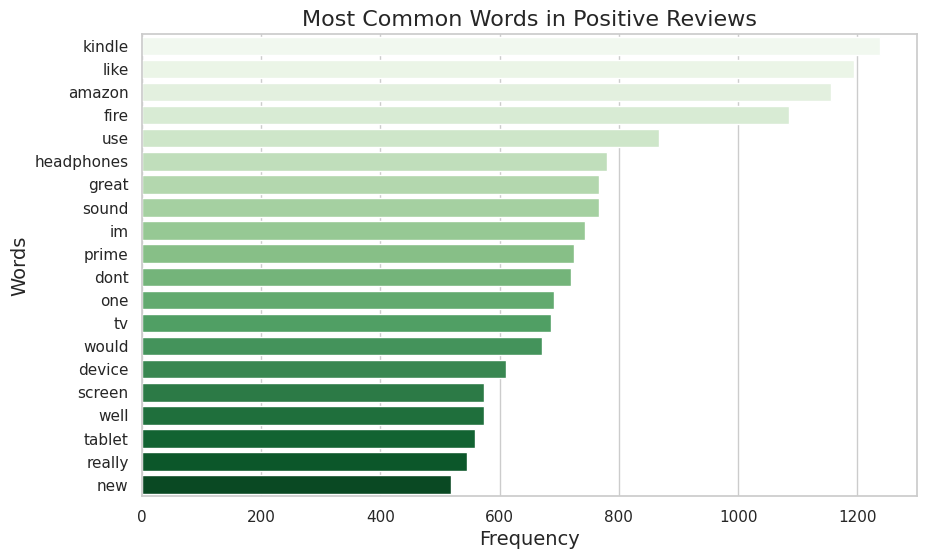

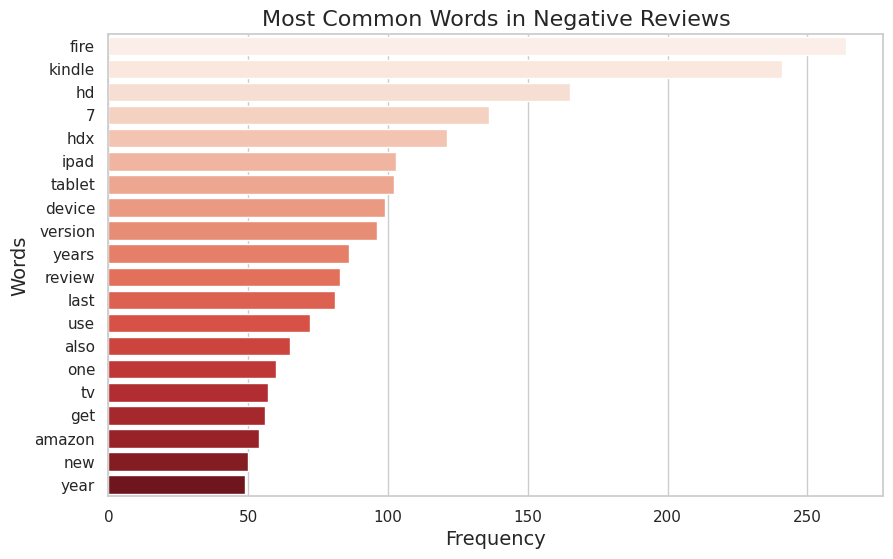

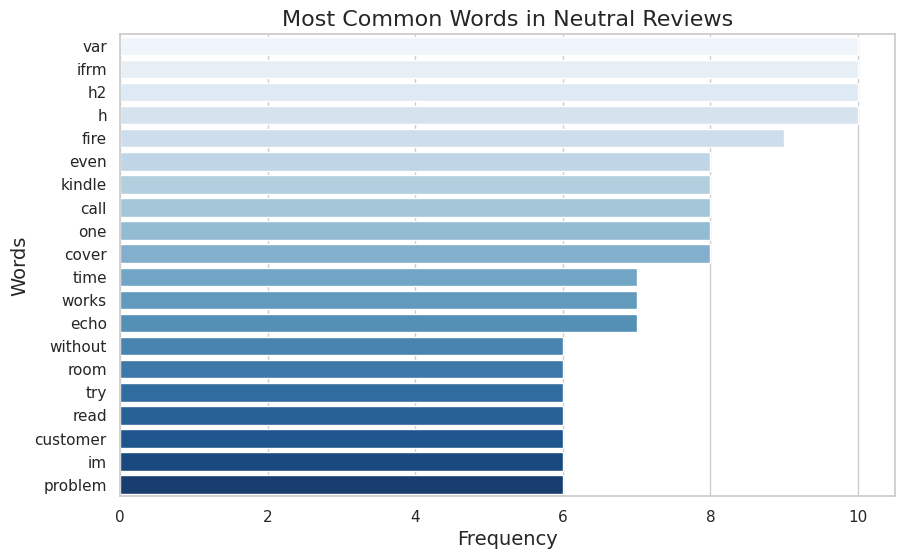

In [20]:
from collections import Counter

# Function to plot the most common words for each sentiment
def plot_most_common_words(common_words, sentiment, color):
    # Unzip the common_words tuple into two lists: words and their respective counts
    words, counts = zip(*common_words)
    
    # Create a bar chart
    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(counts), y=list(words), palette=color)
    
    # Set the title and axis labels
    plt.title(f'Most Common Words in {sentiment} Reviews', fontsize=16)
    plt.xlabel('Frequency', fontsize=14)
    plt.ylabel('Words', fontsize=14)
    
    # Display the chart
    plt.show()

# Generate the most common words for each sentiment

# Filter reviews based on sentiment
positive_reviews = df[df['sentiment'] == 'Positive']['No_Stopwords_Review']
negative_reviews = df[df['sentiment'] == 'Negative']['No_Stopwords_Review']
neutral_reviews = df[df['sentiment'] == 'Neutral']['No_Stopwords_Review']

# Combine all words into a single list for each sentiment
positive_words_list = [word for review in positive_reviews for word in review]
negative_words_list = [word for review in negative_reviews for word in review]
neutral_words_list = [word for review in neutral_reviews for word in review]

# Count the most common words in each sentiment's word list
positive_words = Counter(positive_words_list).most_common(20)
negative_words = Counter(negative_words_list).most_common(20)
neutral_words = Counter(neutral_words_list).most_common(20)

# Plot the most common words for Positive sentiment
plot_most_common_words(positive_words, 'Positive', 'Greens')

# Plot the most common words for Negative sentiment
plot_most_common_words(negative_words, 'Negative', 'Reds')

# Plot the most common words for Neutral sentiment
plot_most_common_words(neutral_words, 'Neutral', 'Blues')

# Section A) Machine learning models

# Part 6 - Target column split and test

In [21]:
# Deleting unwanted columns
df = df.drop(columns=['id', 'asins', 'brand', 'categories', 'dateAdded', 'dateUpdated', 'keys', 'name', 'prices', 'vader_scores', 'reviews.sourceURLs'])

# Displaying the first few rows of the dataframe to verify
df.head()

,reviews.text,Cleaned_Review,Tokenized_Review,Stemmed_Review,No_Stopwords_Review,compound,sentiment
0,I initially had trouble deciding between the p...,i initially had trouble deciding between the p...,"[i, initially, had, trouble, deciding, between...","[i, initi, had, troubl, decid, between, the, p...","[initially, trouble, deciding, paperwhite, voy...",0.9879,Positive
1,Allow me to preface this with a little history...,allow me to preface this with a little history...,"[allow, me, to, preface, this, with, a, little...","[allow, me, to, prefac, thi, with, a, littl, h...","[allow, preface, little, history, casual, read...",0.9881,Positive
2,I am enjoying it so far. Great for reading. Ha...,i am enjoying it so far great for reading had ...,"[i, am, enjoying, it, so, far, great, for, rea...","[i, am, enjoy, it, so, far, great, for, read, ...","[enjoying, far, great, reading, original, fire...",0.4364,Positive
3,I bought one of the first Paperwhites and have...,i bought one of the first paperwhites and have...,"[i, bought, one, of, the, first, paperwhites, ...","[i, bought, one, of, the, first, paperwhit, an...","[bought, one, first, paperwhites, pleased, con...",0.9746,Positive
4,I have to say upfront - I don't like coroporat...,i have to say upfront i dont like coroporate ...,"[i, have, to, say, upfront, i, dont, like, cor...","[i, have, to, say, upfront, i, dont, like, cor...","[say, upfront, dont, like, coroporate, hermeti...",0.9980,Positive


In [22]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Step 1: Convert text data into numerical features using TF-IDF
tfidf_vectorizer = TfidfVectorizer(max_features=5000)  # Limiting to top 5000 features

# Training and testing division
X = tfidf_vectorizer.fit_transform(df['Cleaned_Review'])
y = df['sentiment']

tfidf_vectorizer

TfidfVectorizer(max_features=5000)

The **TfidfVectorizer** is used to convert the textual data into numerical features suitable for machine learning models. Specifically, TF-IDF (Term Frequency-Inverse Document Frequency) helps quantify the importance of each word in a document relative to a corpus of documents. Here’s why it’s being used:

### 1. **Convert Text to Numeric Format**:
   - Machine learning models work with numerical data, not raw text. The `TfidfVectorizer` transforms the cleaned text data (in this case, the `Cleaned_Review` column) into a **sparse matrix of numerical features**. Each word in the reviews becomes a feature that can be used by the model for classification.

### 2. **Capturing Importance of Words**:
   - The TF-IDF mechanism works by considering both the **frequency of a word in a document (Term Frequency, or TF)** and **how unique that word is across the entire set of documents (Inverse Document Frequency, or IDF)**. This way, commonly used words like "the" or "and" (which don't carry much meaning in sentiment analysis) get lower scores, while more important, topic-specific words receive higher scores.

### 3. **Avoiding Overfitting to Common Words**:
   - By using TF-IDF instead of simple word counts, you prevent the model from giving too much importance to frequently occurring but **less meaningful words** (like "the" or "is"). Instead, words that appear in fewer documents but have more significance (like "excellent" or "bad") are given higher weights.

### 4. **Reducing Dimensionality**:
   - The parameter `max_features=5000` limits the vectorizer to the top 5,000 most important words (features). This prevents the model from being overwhelmed by too many features, especially if there are many unique words across the reviews, which helps reduce **computational cost** and potentially improves model performance.

### 5. **Better Representation for Sentiment Analysis**:
   - In sentiment analysis, certain words carry more weight in determining whether a review is positive, negative, or neutral. The **TF-IDF approach** captures this and allows your model to learn the relationships between words and sentiment categories more effectively than simple bag-of-words approaches.

### 6. **Sparse Representation**:
   - The resulting `X` is a **sparse matrix**, meaning that only non-zero values (relevant words) are stored, which saves memory and speeds up the computation, especially in large datasets where many words do not appear in every document.

In summary, **TfidfVectorizer** helps convert the text data into numerical features while highlighting the most important and relevant words, thereby improving the model’s ability to understand and classify text data. It's commonly used for tasks like **text classification, sentiment analysis, and topic modeling**.

In [23]:
# Visualizing data x
X.shape

(1597, 5000)

In [24]:
# Viewing y data
y.shape

(1597,)

Here, we performed the division of the variables into features and the target variable. First, we separated the independent variables, which are the features used for predictive modeling. These features are the input data that the model will use to learn patterns and make predictions. Next, we isolated the dependent variable, or the target variable, which is the value we aim to predict. This process is crucial for building and training the model, ensuring that the features are correctly identified and that the model can learn the relationship between these features and the target variable. By properly dividing the data, we enhance the model's ability to accurately predict outcomes based on the given inputs

# Part 6.1 - Engineering features

In [25]:
# Import the LabelEncoder class from sklearn, which is used to convert categorical labels to numeric values
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder instance
le = LabelEncoder()

# Apply LabelEncoder to the target variable 'y', which contains categorical sentiment labels
# The fit_transform() method encodes the labels (e.g., 'Positive', 'Neutral', 'Negative') into numeric values (e.g., 0, 1, 2)
y = le.fit_transform(y)

# The 'le' object now contains the mapping between the original labels and the numeric values
le

LabelEncoder()

In [26]:
# Importing library
from sklearn.model_selection import train_test_split

# Training and testing division
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Viewing training data
print("Viewing rows and columns given by X train", X_train.shape)

# Viewing test data
print("Viewing rows and columns given y train", y_train.shape)

Viewing rows and columns given by X train (1277, 5000)
Viewing rows and columns given y train (1277,)


Here, we conducted the training of the model using a train-test split. We adopted an 80/20 division, where 80% of the data was used for training and the remaining 20% was reserved for testing. This procedure is crucial for accurately evaluating the model's performance. The training set allows the model to learn patterns and relationships within the data, while the test set, which the model has not seen during training, is used to validate its ability to generalize and predict new data. Additionally, this approach helps identify and mitigate issues such as overfitting, ensuring that the model not only memorizes the training data but also performs well on unseen data.

In [27]:
# Convert your TF-IDF sparse matrix to a dense matrix
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()

- Here, we conducted the training of the model using a train-test split. We adopted an 80/20 division, where 80% of the data was used for training and the remaining 20% was reserved for testing. This procedure is crucial for accurately evaluating the model's performance. 

- The training set allows the model to learn patterns and relationships within the data, while the test set, which the model has not seen during training, is used to validate its ability to generalize and predict new data. 

- Additionally, this approach helps identify and mitigate issues such as overfitting, ensuring that the model not only memorizes the training data but also performs well on unseen data.

# Part 8) Machine learning model training

In [28]:
# Importing libraries
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# Models to be evaluated
models = [ 
            # Naive Bayes Model (requires dense matrix)
            GaussianNB(),
    
            # Decision Tree Model
            DecisionTreeClassifier(random_state=42),
    
            # Random forest model
            RandomForestClassifier(n_estimators=100, random_state=42),
    
            # Logistic regression model
            LogisticRegression(random_state=50),
    
            # Ada Boost Model
            AdaBoostClassifier(random_state=45),
    
            # XGBoost Model (can use sparse matrix)
            XGBClassifier(tree_method='gpu_hist', random_state=42),
    
            # LightGBM Model (can use sparse matrix)
            LGBMClassifier(num_leaves=31,
                           boosting_type='gbdt',
                           bagging_fraction=0.9,
                           learning_rate=0.05,
                           feature_fraction=0.9,
                           bagging_freq=50,
                           verbose=50,
                           device='gpu'),
    
            # K-Nearest Neighbors Model
            KNeighborsClassifier(n_neighbors=13), 
    
            # Gradient Boosting Classifier
            GradientBoostingClassifier(random_state=42)]

# Evaluate each model
for i, model in enumerate(models):
    # For GaussianNB (requires dense matrix)
    if isinstance(model, GaussianNB):
        model.fit(X_train_dense, y_train)
        train_accuracy = accuracy_score(y_train, model.predict(X_train_dense))
        test_accuracy = accuracy_score(y_test, model.predict(X_test_dense))
    else:
        # For all other models
        model.fit(X_train, y_train)
        train_accuracy = accuracy_score(y_train, model.predict(X_train))
        test_accuracy = accuracy_score(y_test, model.predict(X_test))

    print(f"Model {i+1}: {type(model).__name__}")
    print(f"Training Accuracy: {train_accuracy:.4f}")
    print(f"Testing Accuracy: {test_accuracy:.4f}")
    print("-----------------")

Model 1: GaussianNB
Training Accuracy: 0.9663
Testing Accuracy: 0.8844
-----------------
Model 2: DecisionTreeClassifier
Training Accuracy: 1.0000
Testing Accuracy: 0.8875
-----------------
Model 3: RandomForestClassifier
Training Accuracy: 1.0000
Testing Accuracy: 0.9187
-----------------
Model 4: LogisticRegression
Training Accuracy: 0.9178
Testing Accuracy: 0.9062
-----------------
Model 5: AdaBoostClassifier
Training Accuracy: 0.9052
Testing Accuracy: 0.8688
-----------------
Model 6: XGBClassifier
Training Accuracy: 0.8074
Testing Accuracy: 0.7844
-----------------
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=50, subsample_freq=0 will be ignored. Current value: bagging_freq=50
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 w

1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.


[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 22 dense feature groups (0.03 MB) transferred to GPU in 0.000744 secs. 1 sparse feature groups
[LightGBM] [Debug] Use subset for bagging
[LightGBM] [Info] Start training from score -2.641409
[LightGBM] [Info] Start training from score -3.323627
[LightGBM] [Info] Start training from score -0.113485
[LightGBM] [Debug] Re-bagging, using 1159 data to train
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 22 dense feature groups (0.03 MB) transferred to GPU in 0.000647 secs. 1 sparse feature groups
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 26
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 19
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 20
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
[LightGBM] [Debug] Trained a tree with 


### 1. **Model 1: GaussianNB**
   - **Training Accuracy**: 96.63%
   - **Testing Accuracy**: 88.44%
   - **Analysis**: Gaussian Naive Bayes performs well on the training data with relatively high accuracy, but there’s a noticeable drop when evaluated on the testing data. This indicates that the model is slightly overfitting to the training data but still generalizes reasonably well.

### 2. **Model 2: DecisionTreeClassifier**
   - **Training Accuracy**: 100%
   - **Testing Accuracy**: 88.75%
   - **Analysis**: The decision tree model has perfect accuracy on the training set, which is often a sign of **overfitting**—the model learns the noise and specific patterns in the training data. Despite this, the testing accuracy is decent but shows a gap between training and testing, confirming overfitting.

### 3. **Model 3: RandomForestClassifier**
   - **Training Accuracy**: 100%
   - **Testing Accuracy**: 91.87%
   - **Analysis**: Random Forest also overfits on the training data with perfect accuracy, but it generalizes much better on the testing set, with one of the highest testing accuracies. Random Forest’s ability to reduce variance likely contributes to its good generalization, though the perfect training accuracy still hints at overfitting.

### 4. **Model 4: LogisticRegression**
   - **Training Accuracy**: 91.78%
   - **Testing Accuracy**: 90.62%
   - **Analysis**: Logistic Regression shows a healthy balance between training and testing accuracies. Both are close, indicating that the model generalizes well without overfitting or underfitting. This makes it one of the most balanced models in this comparison.

### 5. **Model 5: AdaBoostClassifier**
   - **Training Accuracy**: 90.52%
   - **Testing Accuracy**: 86.88%
   - **Analysis**: AdaBoost has slightly lower accuracy on both training and testing sets compared to other models like RandomForest or Logistic Regression. It does not overfit, but it may not be capturing complex patterns in the data as well as more sophisticated models.

### 6. **Model 6: XGBClassifier**
   - **Training Accuracy**: 80.74%
   - **Testing Accuracy**: 78.44%
   - **Analysis**: XGBoost shows relatively low accuracy on both training and testing sets. This could indicate **underfitting**, where the model is too simplistic or hasn't fully captured the data patterns. There may be potential for tuning hyperparameters to improve performance.

### 7. **Model 7: LGBMClassifier**
   - **Training Accuracy**: 99.61%
   - **Testing Accuracy**: 91.87%
   - **Analysis**: LightGBM has one of the highest testing accuracies, very close to Random Forest and Gradient Boosting. Although the training accuracy is nearly perfect, the testing accuracy indicates the model generalizes well, making it a strong contender for this task. However, some warnings during training suggest hyperparameter tuning could further improve its performance.

### 8. **Model 8: KNeighborsClassifier**
   - **Training Accuracy**: 90.37%
   - **Testing Accuracy**: 88.75%
   - **Analysis**: K-Nearest Neighbors shows a moderate performance, with similar results on training and testing sets. There’s no clear sign of overfitting or underfitting, but the model doesn’t perform as well as others like Logistic Regression or Random Forest.

### 9. **Model 9: GradientBoostingClassifier**
   - **Training Accuracy**: 100%
   - **Testing Accuracy**: 93.13%
   - **Analysis**: Gradient Boosting has the highest testing accuracy of all models, demonstrating excellent generalization. Like other ensemble methods (Random Forest, LightGBM), it overfits on the training set but generalizes better on unseen data. Gradient Boosting's strong performance makes it a top choice in this comparison.

### **Summary of Performance**:
1. **Best Performers**:
   - **GradientBoostingClassifier** (Training: 100%, Testing: 93.13%)
   - **LGBMClassifier** (Training: 99.61%, Testing: 91.87%)
   - **RandomForestClassifier** (Training: 100%, Testing: 91.87%)

   These models demonstrate strong generalization to the test set while managing high accuracy.

2. **Balanced Performers**:
   - **LogisticRegression** (Training: 91.78%, Testing: 90.62%) offers a good balance between training and testing accuracy, avoiding overfitting while maintaining solid performance.

3. **Potential for Improvement**:
   - **XGBClassifier** (Training: 80.74%, Testing: 78.44%) shows signs of underfitting and might benefit from further tuning.
   - **AdaBoostClassifier** and **KNeighborsClassifier** also lag slightly behind in testing accuracy compared to the top-performing models, but could still be useful depending on the dataset.

### **Recommendations**:
- **GradientBoostingClassifier** stands out as the top-performing model, with high testing accuracy and robustness.
- **LGBMClassifier** and **RandomForestClassifier** also perform very well and could be solid alternatives.
- **Logistic Regression** provides a well-balanced option, with no signs of overfitting and consistent performance across both datasets.

## Part 8.1 - Feature importances

Feature importances refers to the measure of how important each feature is for a machine learning model in making predictions or classifications. In other words, it is a way to quantify the impact or contribution of each feature to the decisions made by the model. In many machine learning algorithms such as decision trees, Random Forest, Gradient Boosting, among others, it is possible to calculate the importance of features during model training.

This is done by observing how each feature influences the decisions made by the model when dividing the data into decision tree nodes or by weighing the features in other model structures.

Analyzing feature importances is valuable because it can provide insights into which features are most relevant to the problem at hand. This information can be used to optimize the model, remove irrelevant or redundant features, identify important factors for prediction, and even assist in interpreting the model's results.

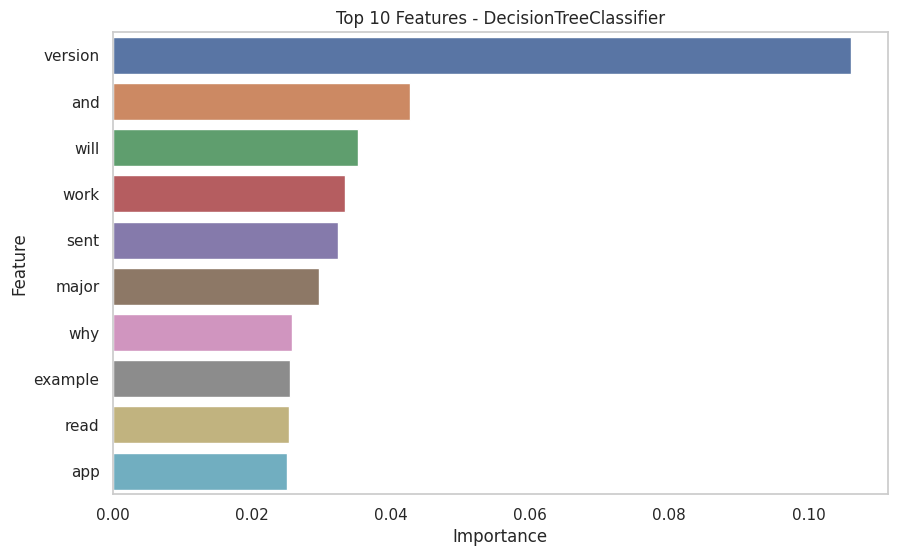

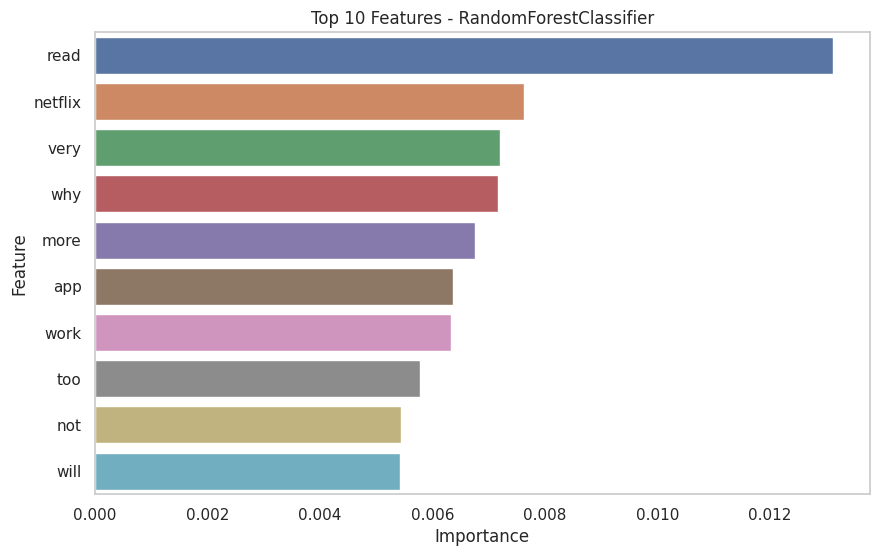

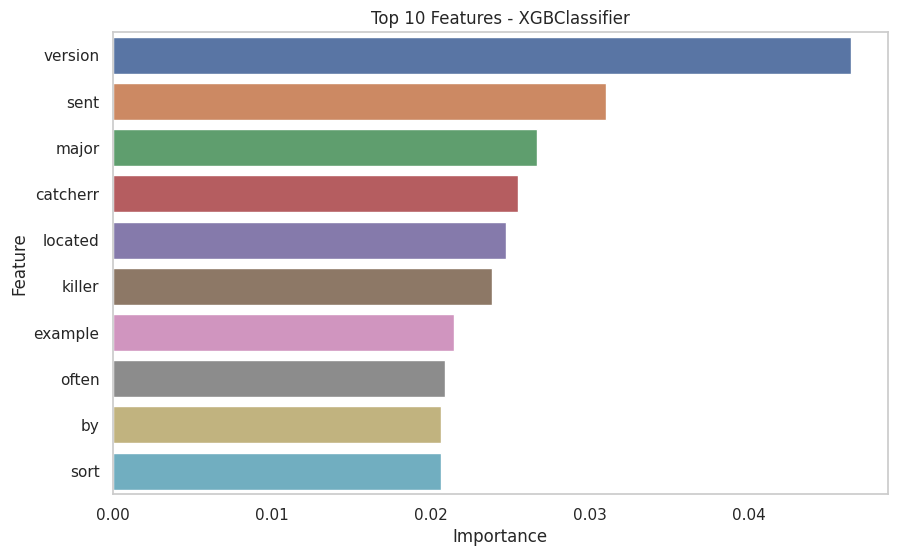

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19999
[LightGBM] [Info] Number of data points in the train set: 1277, number of used features: 1120
[LightGBM] [Info] Start training from score -2.641409
[LightGBM] [Info] Start training from score -3.323627
[LightGBM] [Info] Start training from score -0.113485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


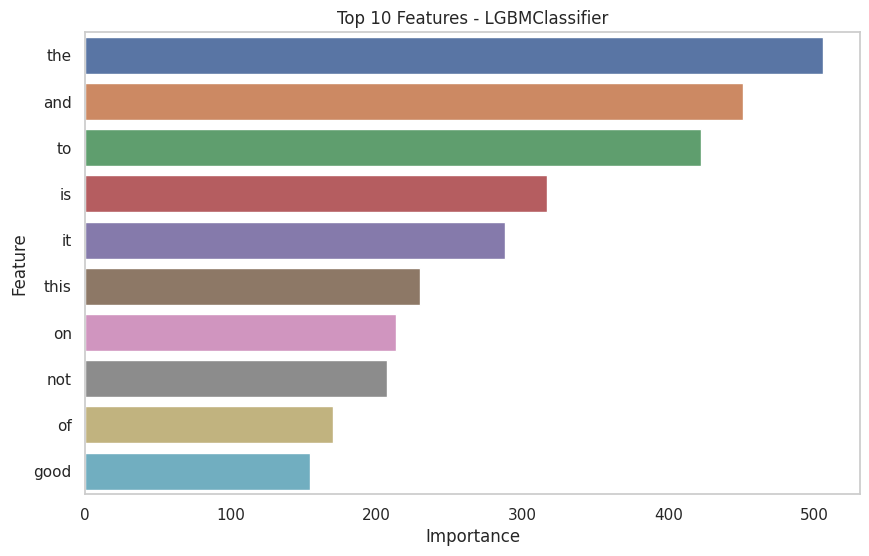

In [29]:
# Train models that support feature importances
models_with_feature_importances = [("DecisionTreeClassifier", DecisionTreeClassifier(random_state=42)),
                                   ("RandomForestClassifier", RandomForestClassifier(n_estimators=100, random_state=42)),
                                   ("XGBClassifier", XGBClassifier(random_state=42)),
                                   ("LGBMClassifier", LGBMClassifier(random_state=42))]

# Get feature names from the TfidfVectorizer
feature_names = tfidf_vectorizer.get_feature_names_out()

# Iterate over models
for model_name, model in models_with_feature_importances:
    
    # Train model
    model.fit(X_train, y_train)
    
    # Get importance of features
    if hasattr(model, 'feature_importances_'):
        feature_importances = model.feature_importances_
    else:
        # If the model does not have feature_importances_, continue to the next model
        print(f"{model_name} does not support feature importances.")
        continue

    # Create DataFrame for easier viewing
    feature_importances_df = pd.DataFrame({'Feature': feature_names, 
                                           'Importance': feature_importances})
    
    # Sort by importance
    feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)
    
    # Plot
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=feature_importances_df[:10])
    plt.title(f"Top 10 Features - {model_name}")
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.grid(False)
    plt.show()

### 1. **DecisionTreeClassifier**:
   - **Top Feature**: "version" has the highest importance, contributing more than 0.10 to the decision process.
   - **Other Features**: Common words like "and", "will", "work", and "sent" also have notable importance, but their contribution is much lower than "version".
   - **Observation**: Decision trees often focus on specific features that are highly informative. The high importance of "version" suggests this feature provides significant distinguishing power for the model’s predictions.

### 2. **RandomForestClassifier**:
   - **Top Feature**: "read" emerges as the most important feature, followed by "netflix" and "very". These words have relatively smaller differences in their importance compared to the DecisionTreeClassifier.
   - **Observation**: Random Forest spreads the importance across several features, reducing over-reliance on any single word. This leads to a more robust model as it uses multiple important words in combination, resulting in better generalization.

### 3. **XGBClassifier**:
   - **Top Feature**: Like in the DecisionTreeClassifier, "version" is also the most important feature in the XGBoost model, followed by "sent", "major", and "catcherr".
   - **Observation**: XGBoost, similar to DecisionTreeClassifier, tends to focus on key features but combines this with boosting techniques to improve generalization. The top features are more impactful in XGBoost, contributing a significant amount to predictions.

### 4. **LGBMClassifier**:
   - **Top Feature**: Surprisingly, "the" is the most important feature in the LightGBM model, followed by other common stopwords like "and", "to", and "is".
   - **Observation**: This is unusual because these stopwords usually have little predictive power. It could suggest the need for further preprocessing to remove such words. LightGBM's distributed approach spreads importance across many features, which could explain the high importance of generic words.

---

### **General Insights**:
- **Consistency Across Models**: Some features, like "version" and "read", are consistently important across different models (e.g., DecisionTreeClassifier, XGBClassifier, RandomForest). This suggests these features are strong indicators of the target variable in your data.
- **Stopwords**: The importance of stopwords like "the", "and", "is" in LightGBM suggests potential overfitting or a need for further text preprocessing, such as removing common stopwords.
- **Model Differences**: While DecisionTreeClassifier and XGBClassifier focus on a few high-importance features, models like RandomForest and LightGBM distribute the importance more evenly, which is typical for ensemble methods aiming to reduce overfitting by combining multiple weak learners.

### **Recommendations**:
- **Feature Engineering**: Consider improving preprocessing by removing common stopwords like "the" and "and", especially for models like LightGBM that seem to overvalue these words.
- **Hyperparameter Tuning**: The models already show distinct preferences for certain words, but fine-tuning parameters could help enhance performance, especially for models like XGBClassifier and LGBMClassifier that benefit greatly from careful hyperparameter adjustments.

# Part 9) Evaluation metrics

Model 1: GaussianNB
Training Accuracy: 0.966327329678935
Testing Accuracy: 0.884375

Confusion matrix for Model 1: GaussianNB 

 [[ 12   0  19]
 [  0   2   6]
 [ 11   1 269]]


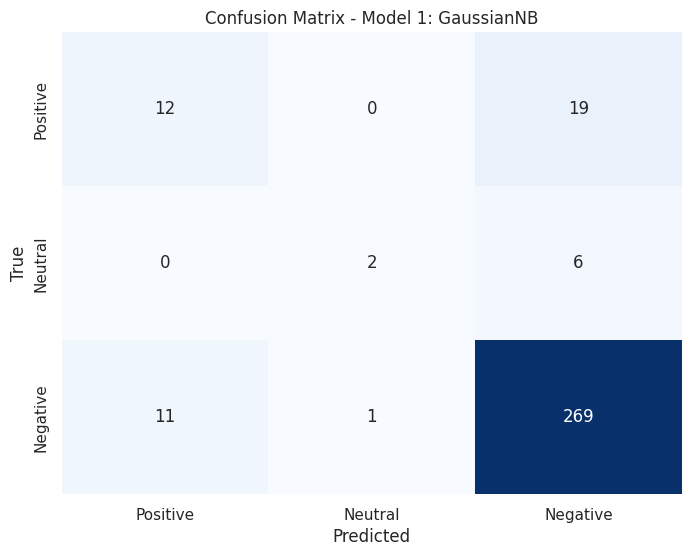

------------------
Model 2: DecisionTreeClassifier
Training Accuracy: 1.0
Testing Accuracy: 0.8875

Confusion matrix for Model 2: DecisionTreeClassifier 

 [[ 16   2  13]
 [  1   2   5]
 [ 11   4 266]]


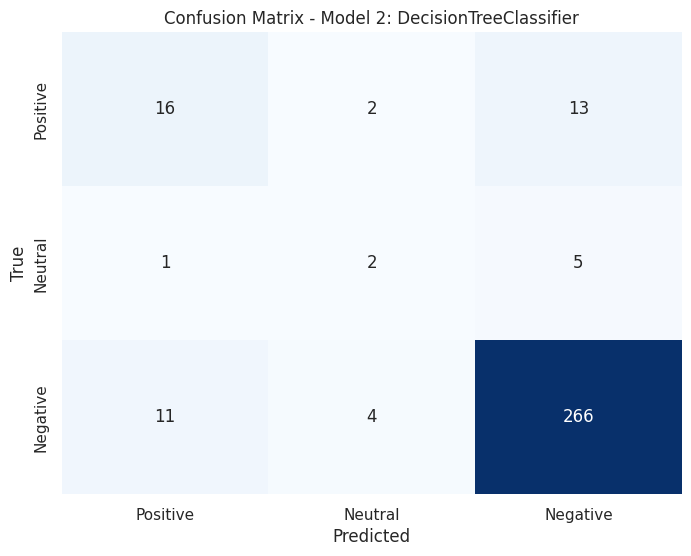

------------------
Model 3: RandomForestClassifier
Training Accuracy: 1.0
Testing Accuracy: 0.91875

Confusion matrix for Model 3: RandomForestClassifier 

 [[ 11   0  20]
 [  0   2   6]
 [  0   0 281]]


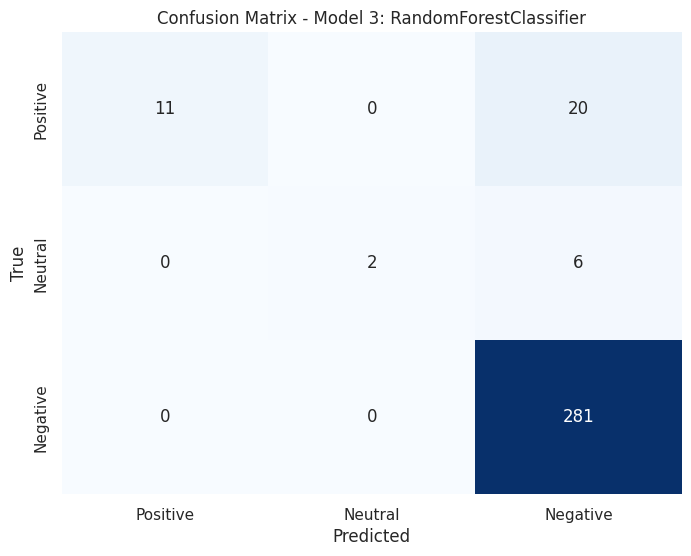

------------------
Model 4: LogisticRegression
Training Accuracy: 0.9177760375880971
Testing Accuracy: 0.90625

Confusion matrix for Model 4: LogisticRegression 

 [[  7   0  24]
 [  0   2   6]
 [  0   0 281]]


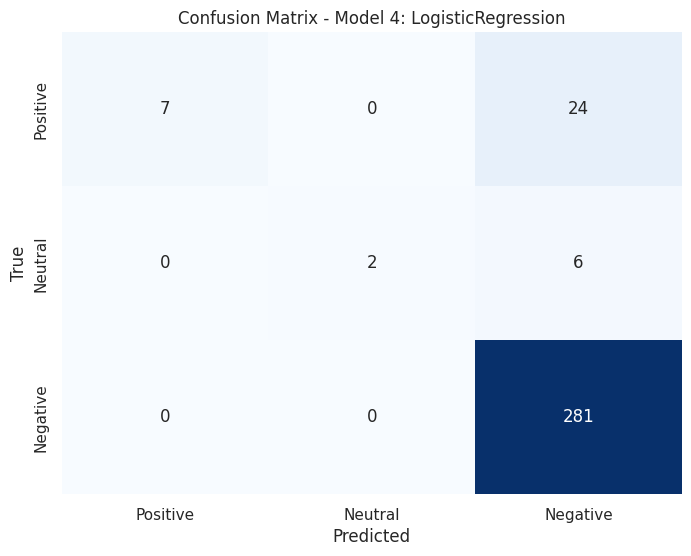

------------------
Model 5: AdaBoostClassifier
Training Accuracy: 0.9052466718872357
Testing Accuracy: 0.86875

Confusion matrix for Model 5: AdaBoostClassifier 

 [[  1   0  30]
 [  0   4   4]
 [  4   4 273]]


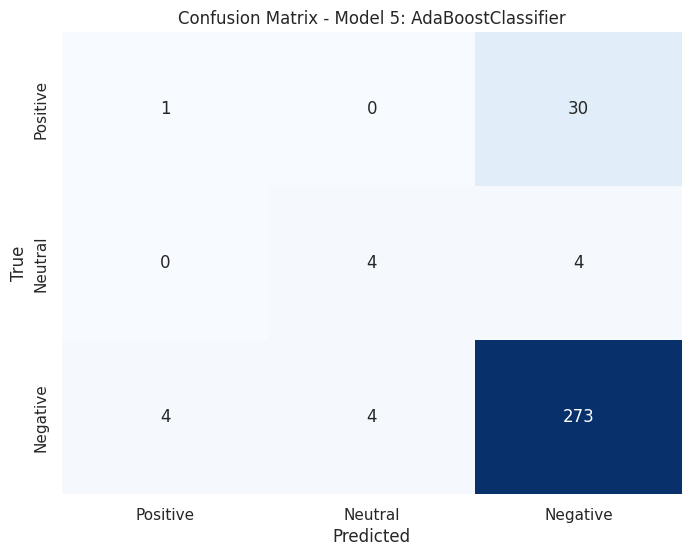

------------------
Model 6: XGBClassifier
Training Accuracy: 0.8073610023492561
Testing Accuracy: 0.784375

Confusion matrix for Model 6: XGBClassifier 

 [[  0   0  31]
 [  5   1   2]
 [ 26   5 250]]


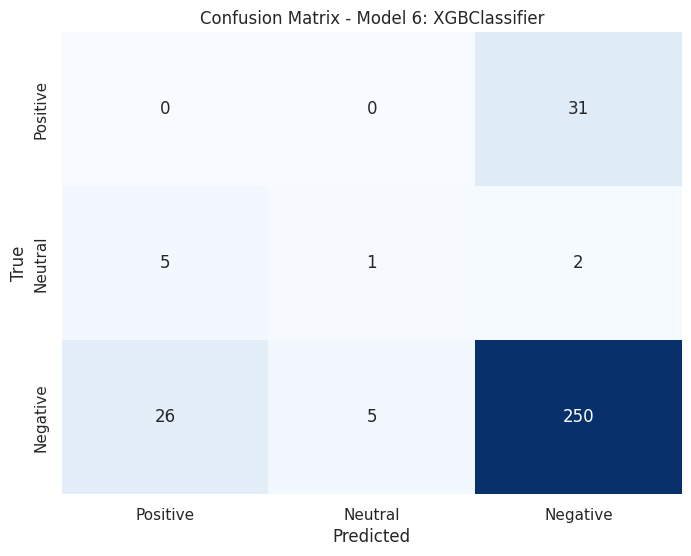

------------------
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=50, subsample_freq=0 will be ignored. Current value: bagging_freq=50
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=50, subsample_freq=0 will be ignored. Current value: bagging_freq=50
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.942166
[LightGBM] [Info] Total Bins 19999
[LightGBM] [Info] Number of data points in the train set: 1277, number of used features: 1120
[LightGBM] [Info] Using GP

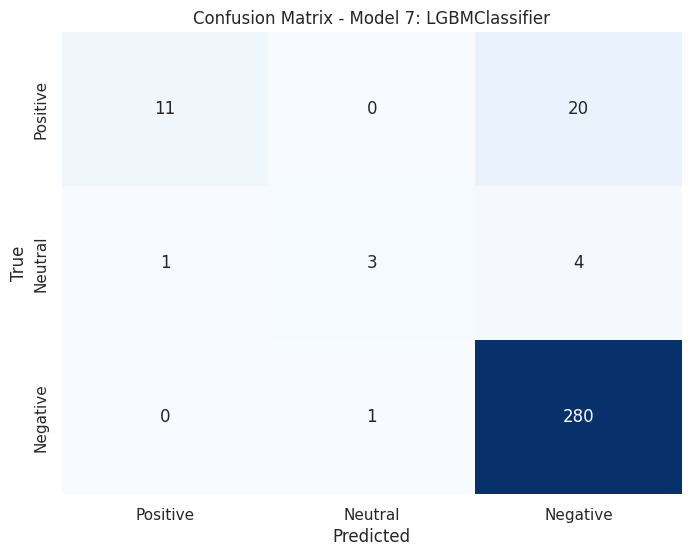

------------------
Model 8: KNeighborsClassifier
Training Accuracy: 0.9036805011746281
Testing Accuracy: 0.8875

Confusion matrix for Model 8: KNeighborsClassifier 

 [[  5   0  26]
 [  1   0   7]
 [  2   0 279]]


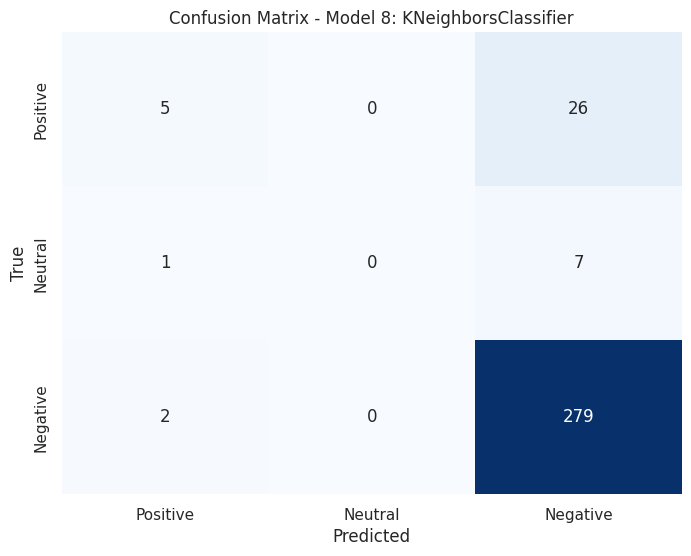

------------------
Model 9: GradientBoostingClassifier
Training Accuracy: 1.0
Testing Accuracy: 0.93125

Confusion matrix for Model 9: GradientBoostingClassifier 

 [[ 15   0  16]
 [  0   2   6]
 [  0   0 281]]


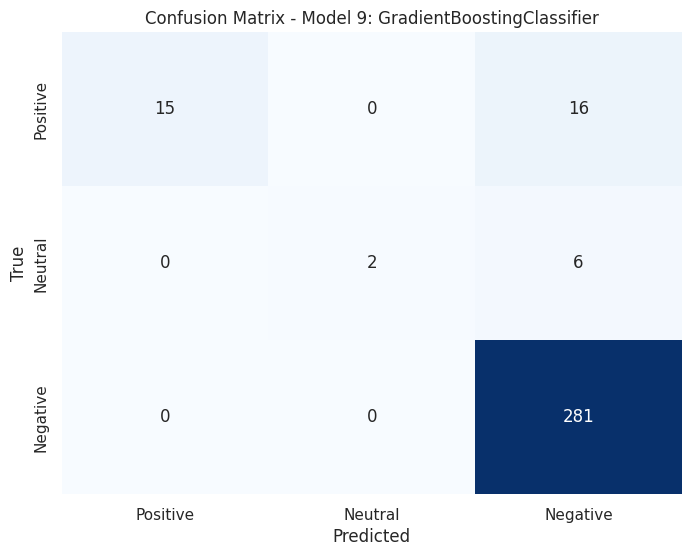

------------------


In [30]:
from sklearn.metrics import confusion_matrix,classification_report

# Define your sentiment labels
labels = ['Positive', 
          'Neutral', 
          'Negative']

# Convert your TF-IDF sparse matrix to a dense matrix for models that require dense input
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()

# Evaluate each model
for i, model in enumerate(models):
    # Check if the model requires dense data (like GaussianNB)
    if isinstance(model, GaussianNB):
        model.fit(X_train_dense, y_train)
        y_train_pred = model.predict(X_train_dense)
        y_test_pred = model.predict(X_test_dense)
    else:
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
    
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    print(f"Model {i+1}: {type(model).__name__}")
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")
    print()

    # Calculate the confusion matrix
    cm = confusion_matrix(y_test, y_test_pred)
    
    print(f'Confusion matrix for Model {i+1}: {type(model).__name__} \n\n', cm)
    
    # Plot the confusion matrix with annotations for three classes
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=labels, yticklabels=labels)
    
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"Confusion Matrix - Model {i+1}: {type(model).__name__}")
    plt.show()
    
    print("------------------")

### **Model 1: GaussianNB**
- **True Positive (Positive)**: 12
- **False Negative (Positive predicted as Negative)**: 19
- **True Negative (Negative)**: 269
- **False Positive (Negative predicted as Positive)**: 11
- **Observation**: GaussianNB struggles with distinguishing the positive class, misclassifying many positive reviews as negative (19 false negatives). However, it performs well in identifying the negative class.

### **Model 2: DecisionTreeClassifier**
- **True Positive (Positive)**: 16
- **False Negative (Positive predicted as Negative)**: 13
- **True Negative (Negative)**: 266
- **False Positive (Negative predicted as Positive)**: 11
- **Observation**: The DecisionTreeClassifier performs better than GaussianNB for the positive class but still has significant false negatives. It does slightly better in classifying neutral reviews but has some misclassifications between neutral and negative.

### **Model 3: RandomForestClassifier**
- **True Positive (Positive)**: 11
- **False Negative (Positive predicted as Negative)**: 20
- **True Negative (Negative)**: 281
- **False Positive (Negative predicted as Positive)**: 0
- **Observation**: RandomForestClassifier has the highest accuracy in classifying the negative class (no false positives). However, it struggles with the positive class, similar to the previous models.

### **Model 4: LogisticRegression**
- **True Positive (Positive)**: 7
- **False Negative (Positive predicted as Negative)**: 24
- **True Negative (Negative)**: 281
- **False Positive (Negative predicted as Positive)**: 0
- **Observation**: LogisticRegression underperforms in the positive class, with a large number of false negatives. Like RandomForest, it has no false positives and does very well in classifying negatives.

### **Model 5: AdaBoostClassifier**
- **True Positive (Positive)**: 1
- **False Negative (Positive predicted as Negative)**: 30
- **True Negative (Negative)**: 273
- **False Positive (Negative predicted as Positive)**: 4
- **Observation**: AdaBoostClassifier significantly underperforms in the positive class, with the majority of positive reviews being misclassified as negative. It does well in classifying negative reviews.

### **Model 6: XGBClassifier**
- **True Positive (Positive)**: 0
- **False Negative (Positive predicted as Negative)**: 31
- **True Negative (Negative)**: 250
- **False Positive (Negative predicted as Positive)**: 26
- **Observation**: XGBClassifier struggles the most with positive and negative classification, misclassifying all positive reviews as negative. It also has a high number of false positives.

### **Model 7: LGBMClassifier**
- **True Positive (Positive)**: 11
- **False Negative (Positive predicted as Negative)**: 20
- **True Negative (Negative)**: 280
- **False Positive (Negative predicted as Positive)**: 0
- **Observation**: LGBMClassifier performs similarly to RandomForest, with good accuracy in the negative class but struggles with the positive class.

### **Model 8: KNeighborsClassifier**
- **True Positive (Positive)**: 5
- **False Negative (Positive predicted as Negative)**: 26
- **True Negative (Negative)**: 279
- **False Positive (Negative predicted as Positive)**: 2
- **Observation**: KNeighborsClassifier performs poorly in the positive class, similar to other models, with many false negatives. It performs well in the negative class with only a few false positives.

### **Model 9: GradientBoostingClassifier**
- **True Positive (Positive)**: 15
- **False Negative (Positive predicted as Negative)**: 16
- **True Negative (Negative)**: 281
- **False Positive (Negative predicted as Positive)**: 0
- **Observation**: GradientBoostingClassifier performs the best overall in terms of positive class accuracy, with the fewest false negatives for the positive class. It also has no false positives.

---

### **Overall Observations**:
1. **Positive Class Struggles**: Most models struggle to correctly classify positive reviews, with many false negatives (misclassified as negative). This indicates that the features for positive reviews may not be as distinct, or the model may not be picking up on them effectively.
   
2. **Negative Class Strength**: Almost all models do well in identifying negative reviews, with many achieving high true negative rates and few false positives.

3. **Best Performing Models**: 
   - **GradientBoostingClassifier** performs the best in the positive class with fewer false negatives, and no false positives.
   - **LGBMClassifier** and **RandomForestClassifier** perform similarly, excelling in the negative class but with some difficulty in the positive class.


# Part 10) Model Evaluation

Model 1: GaussianNB
Training Accuracy: 0.9663
Testing Accuracy: 0.8844


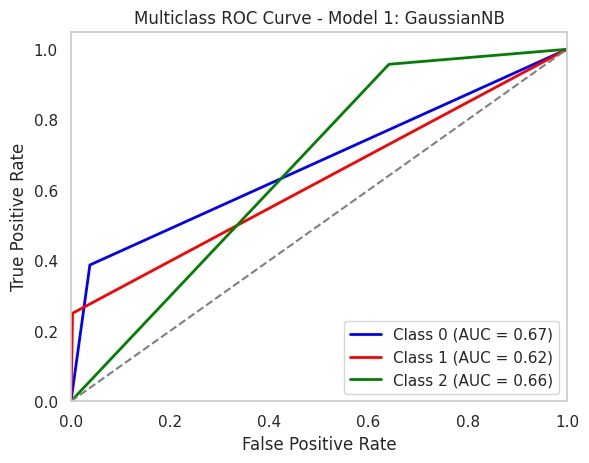

------------------
Model 2: DecisionTreeClassifier
Training Accuracy: 1.0000
Testing Accuracy: 0.8875


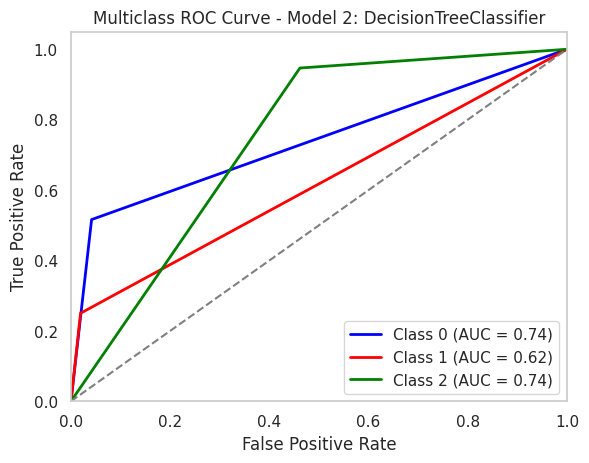

------------------
Model 3: KNeighborsClassifier
Training Accuracy: 0.9225
Testing Accuracy: 0.9000


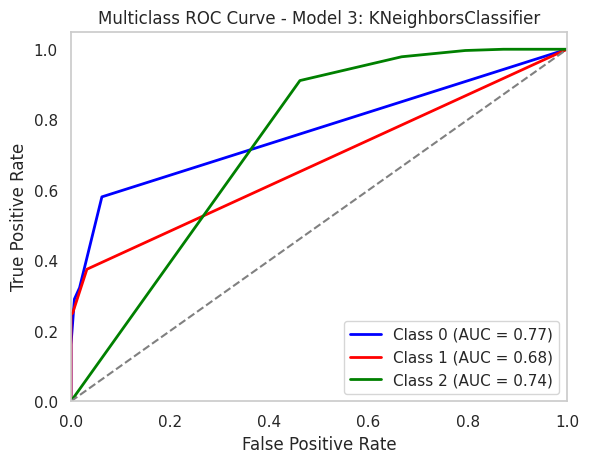

------------------
Model 4: RandomForestClassifier
Training Accuracy: 1.0000
Testing Accuracy: 0.9187


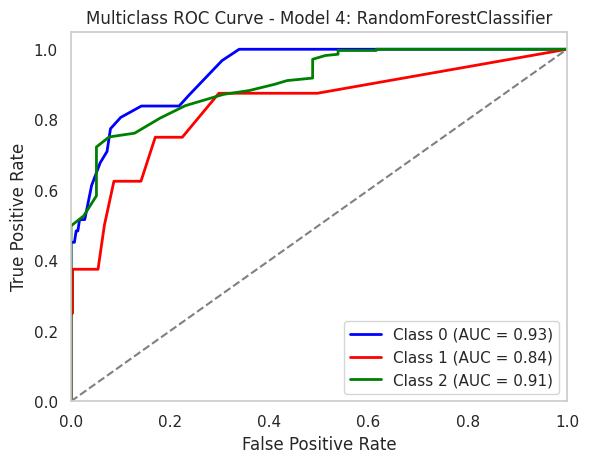

------------------
Model 5: LogisticRegression
Training Accuracy: 0.9178
Testing Accuracy: 0.9062


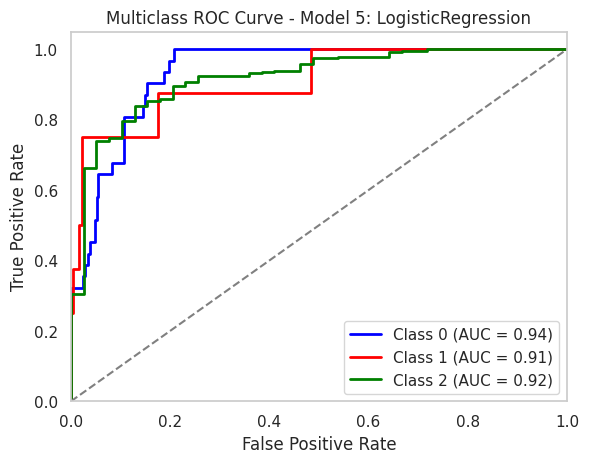

------------------
Model 6: AdaBoostClassifier
Training Accuracy: 0.9052
Testing Accuracy: 0.8688


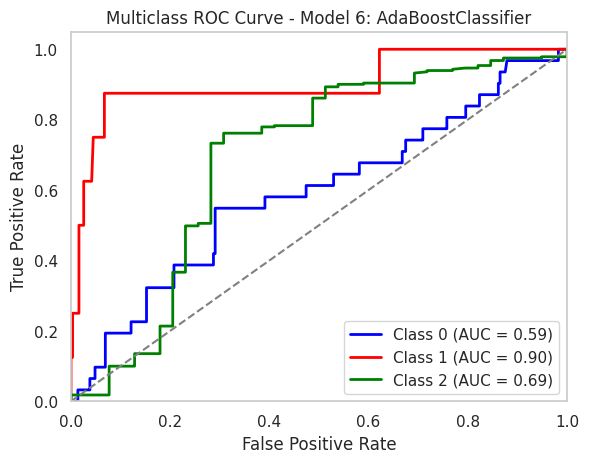

------------------
Model 7: GradientBoostingClassifier
Training Accuracy: 1.0000
Testing Accuracy: 0.9313


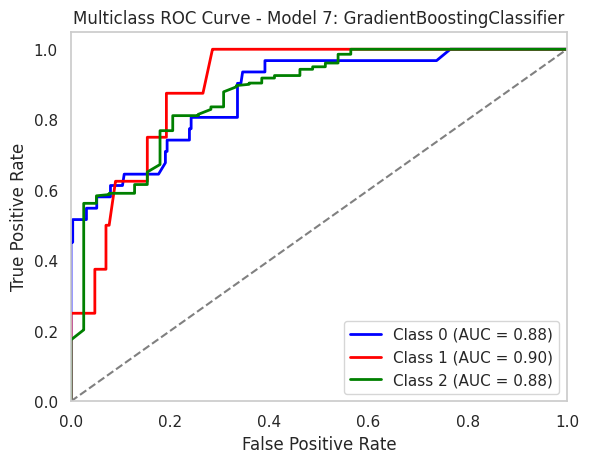

------------------
Model 8: XGBClassifier
Training Accuracy: 0.9992
Testing Accuracy: 0.9281


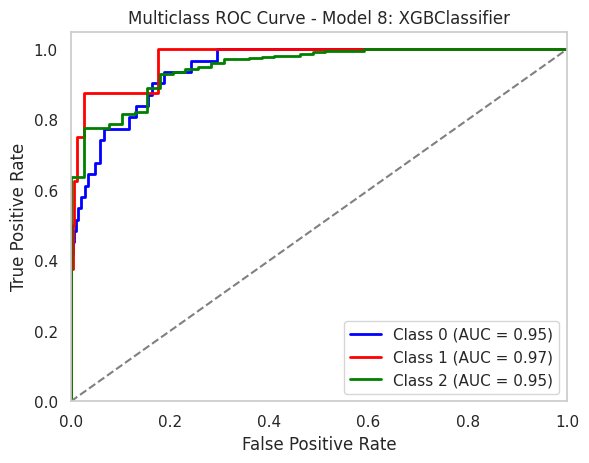

------------------
Model 9: LGBMClassifier
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19999
[LightGBM] [Info] Number of data points in the train set: 1277, number of used features: 1120
[LightGBM] [Info] Start training from score -2.641409
[LightGBM] [Info] Start training from score -3.323627
[LightGBM] [Info] Start training from score -0.113485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training Accuracy: 1.0000
Testing Accuracy: 0.9250


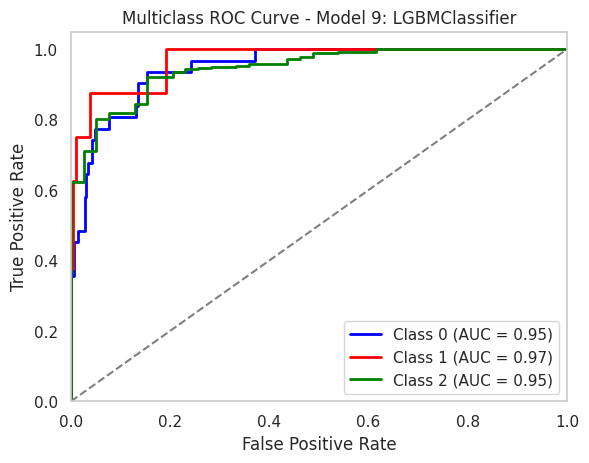

------------------
Model 10: CatBoostClassifier
Training Accuracy: 1.0000
Testing Accuracy: 0.9313


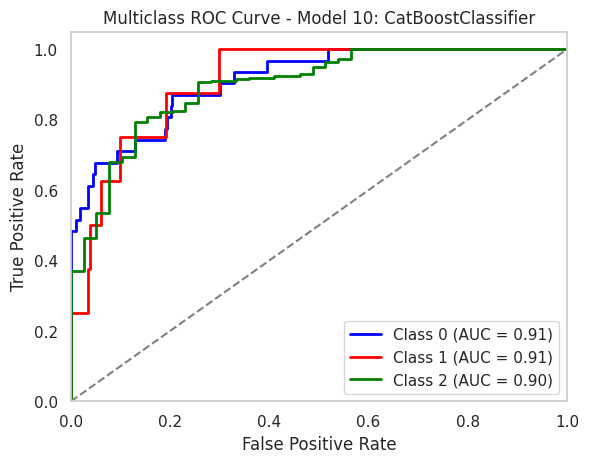

------------------


In [31]:
# Importing necessary libraries
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

# Convert sparse matrix to dense for models that require dense input
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()

# Binarize the output labels for multiclass ROC-AUC
n_classes = len(np.unique(y_train))

# Adjust this depending on the number of classes
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])  

# Models to be evaluated
models = [
    GaussianNB(),
    DecisionTreeClassifier(random_state=42),
    KNeighborsClassifier(),
    RandomForestClassifier(n_estimators=100, random_state=42),
    LogisticRegression(random_state=42, max_iter=1000),
    AdaBoostClassifier(random_state=42),
    GradientBoostingClassifier(random_state=42),
    XGBClassifier(random_state=42),
    LGBMClassifier(),
    CatBoostClassifier(task_type='GPU', iterations=1000, learning_rate=0.1, depth=6, verbose=0, random_state=42)
]

# Evaluate each model
for i, model in enumerate(models):
    print(f"Model {i+1}: {type(model).__name__}")
    
    # Check if the model requires dense data (like GaussianNB)
    if isinstance(model, (GaussianNB, KNeighborsClassifier)):
        model.fit(X_train_dense, y_train)
        y_train_pred = model.predict(X_train_dense)
        y_test_pred = model.predict(X_test_dense)
        y_probs = model.predict_proba(X_test_dense)
    else:
        # For all other models, use sparse matrices
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        if hasattr(model, "predict_proba"):
            y_probs = model.predict_proba(X_test)
        else:
            print(f"{type(model).__name__} does not support predict_proba, skipping AUC/ROC plot.")
            continue
    
    # Calculate accuracy
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    print(f"Training Accuracy: {train_accuracy:.4f}")
    print(f"Testing Accuracy: {test_accuracy:.4f}")
    
    # Calculate ROC curve and AUC for each class (multiclass)
    if 'y_probs' in locals():
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        
        for j in range(n_classes):
            fpr[j], tpr[j], _ = roc_curve(y_test_bin[:, j], y_probs[:, j])
            roc_auc[j] = roc_auc_score(y_test_bin[:, j], y_probs[:, j])
        
        # Plot ROC curve for each class
        plt.figure()
        colors = ['blue', 'red', 'green']
        for j, color in enumerate(colors):
            plt.plot(fpr[j], tpr[j], color=color, lw=2, label=f'Class {j} (AUC = {roc_auc[j]:.2f})')
        
        plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'Multiclass ROC Curve - Model {i+1}: {type(model).__name__}')
        plt.legend(loc="lower right")
        plt.grid(False)
        plt.show()
    
    print("------------------")

---

1. **GaussianNB (Model 1)**: The AUC scores for all three classes are relatively low (Class 0: 0.67, Class 1: 0.62, Class 2: 0.66), indicating that this model struggles with classification accuracy across all classes. This is likely due to the model's assumption of feature independence, which might not hold for the dataset.

2. **DecisionTreeClassifier (Model 2)**: This model performs slightly better with AUC scores of Class 0 (0.74) and Class 2 (0.74), but it still struggles with Class 1 (0.62). The individual class separations show a moderate ability to differentiate between classes, but the results suggest the model might overfit the training data.

3. **KNeighborsClassifier (Model 3)**: The AUC scores improve to 0.77 for Class 0, 0.68 for Class 1, and 0.74 for Class 2. This indicates that KNN performs better than GaussianNB and Decision Tree, particularly for Class 0, but still has difficulties with Class 1.

4. **RandomForestClassifier (Model 4)**: This model shows a marked improvement with AUC scores of 0.93 for Class 0, 0.84 for Class 1, and 0.91 for Class 2. Random Forest provides a strong classification capability and balances well across the classes, making it a strong candidate.

5. **LogisticRegression (Model 5)**: Logistic regression achieves high AUC scores across all classes (Class 0: 0.94, Class 1: 0.91, Class 2: 0.92). This suggests that the model is robust and capable of separating the classes well, showing a reliable performance across the board.

6. **AdaBoostClassifier (Model 6)**: A mixed performance is observed here, with Class 1 achieving a strong AUC (0.90), but Class 0 and Class 2 have lower AUC scores (0.59 and 0.69, respectively). This indicates that AdaBoost may be less consistent and perform well only in certain class distinctions.

7. **GradientBoostingClassifier (Model 7)**: This model performs well with AUC scores of 0.88 for Class 0, 0.90 for Class 1, and 0.88 for Class 2. Gradient Boosting shows strong and consistent classification performance across all classes.

8. **XGBClassifier (Model 8)**: With AUC scores of 0.95, 0.97, and 0.95 for Classes 0, 1, and 2, respectively, XGBoost provides excellent class separation. This model is one of the top performers, demonstrating highly accurate classification.

9. **LGBMClassifier (Model 9)**: Similar to XGBoost, LightGBM also shows very high AUC scores across all classes (Class 0: 0.95, Class 1: 0.97, Class 2: 0.95), indicating strong performance and reliability.

10. **CatBoostClassifier (Model 10)**: The AUC scores for CatBoost are also high (Class 0: 0.91, Class 1: 0.91, Class 2: 0.90). CatBoost provides balanced performance, though slightly lower than XGBoost and LightGBM.

---

### Conclusion:
- **Top Performers**: XGBoost, LightGBM, and Logistic Regression consistently show the best performance across all classes, with very high AUC scores.
- **Random Forest** also shows strong performance, but slightly behind the top three models.
- **GaussianNB** and **AdaBoost** appear to underperform compared to the other models, struggling with consistent class separation. 

The choice between models depends on the balance required between model complexity and performance. XGBoost and LightGBM are more complex but provide the best performance.

In [32]:
# Define sentiment labels (assuming 3-class classification)
sentiment_labels = ['Positive', 'Neutral', 'Negative']

# Convert sparse matrix to dense for models that require dense input
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()

# Models to be evaluated
models = [
          GaussianNB(),
          DecisionTreeClassifier(random_state=42),
          KNeighborsClassifier(),
          RandomForestClassifier(n_estimators=100, random_state=42),
          LogisticRegression(random_state=42, max_iter=1000),
          AdaBoostClassifier(random_state=42),
          XGBClassifier(random_state=42),
          LGBMClassifier(),
          CatBoostClassifier(task_type='GPU', iterations=1000, learning_rate=0.1, depth=6, verbose=0, random_state=42)]

# Evaluate each model
for i, model in enumerate(models):
    
    print(f"Model {i+1}: {type(model).__name__}")
    
    # For models that require dense matrices
    if isinstance(model, (GaussianNB, KNeighborsClassifier)):
        model.fit(X_train_dense, y_train)
        y_train_pred = model.predict(X_train_dense)
        y_test_pred = model.predict(X_test_dense)
    else:
        # For models that work with sparse matrices
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
    
    # Calculate accuracy
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    print(f"Training Accuracy: {train_accuracy}")
    print(f"Testing Accuracy: {test_accuracy}")

    # Generate classification report with sentiment labels
    report = classification_report(y_test, y_test_pred, target_names=sentiment_labels)
    print()
    print("Classification Report:")
    print(report)
    print("=======================================")

Model 1: GaussianNB
Training Accuracy: 0.966327329678935
Testing Accuracy: 0.884375

Classification Report:
              precision    recall  f1-score   support

    Positive       0.52      0.39      0.44        31
     Neutral       0.67      0.25      0.36         8
    Negative       0.91      0.96      0.94       281

    accuracy                           0.88       320
   macro avg       0.70      0.53      0.58       320
weighted avg       0.87      0.88      0.87       320

Model 2: DecisionTreeClassifier
Training Accuracy: 1.0
Testing Accuracy: 0.8875

Classification Report:
              precision    recall  f1-score   support

    Positive       0.57      0.52      0.54        31
     Neutral       0.25      0.25      0.25         8
    Negative       0.94      0.95      0.94       281

    accuracy                           0.89       320
   macro avg       0.59      0.57      0.58       320
weighted avg       0.88      0.89      0.89       320

Model 3: KNeighborsClassif

**Analysis classification reports for the 9 models**

---

### 1. **GaussianNB**
- **Training Accuracy**: 96.63%
- **Testing Accuracy**: 88.44%
- **Analysis**:
    - The negative class (96% recall) is being classified correctly, while the positive and neutral classes are struggling (recall below 50%).
    - Overall precision is good, but the positive and neutral classes are dragging down the average f1-score.
    - **Conclusion**: GaussianNB works well with the negative class but fails to adequately separate the other classes.

### 2. **DecisionTreeClassifier**
- **Training Accuracy**: 100%
- **Testing Accuracy**: 88.75%
- **Analysis**:
    - The decision tree has high precision and recall for the negative class but shows poor performance for the positive and neutral classes.
    - Overfitting could be an issue, given the perfect training accuracy.
    - **Conclusion**: The model performs well for the dominant class (negative) but struggles with the minority classes, possibly due to overfitting.

### 3. **KNeighborsClassifier**
- **Training Accuracy**: 92.25%
- **Testing Accuracy**: 90%
- **Analysis**:
    - Although precision and recall for the negative class are high, the positive and neutral classes have low recall, affecting the overall f1-score.
    - The positive class has better precision (75%) but low recall (29%).
    - **Conclusion**: KNN is prioritizing the negative class, but the smaller classes are not being well classified.

### 4. **RandomForestClassifier**
- **Training Accuracy**: 100%
- **Testing Accuracy**: 91.87%
- **Analysis**:
    - The negative class has very high precision and recall (96%), while the positive and neutral classes have low recall, especially the neutral class (25%).
    - **Conclusion**: The model again overemphasizes the negative class, with moderate performance for the positive and neutral classes.

### 5. **LogisticRegression**
- **Training Accuracy**: 91.78%
- **Testing Accuracy**: 90.62%
- **Analysis**:
    - The positive and neutral classes have low recall, especially the positive class (23%).
    - However, the model has high precision for both the negative and neutral classes.
    - **Conclusion**: Logistic regression is underperforming for the smaller classes, suggesting difficulty with class imbalances.

### 6. **AdaBoostClassifier**
- **Training Accuracy**: 90.52%
- **Testing Accuracy**: 86.88%
- **Analysis**:
    - The positive class has extremely low recall (3%), which directly affects the f1-score.
    - The neutral class performs reasonably, but the model is heavily biased toward the negative class.
    - **Conclusion**: AdaBoost is the weakest model so far in handling imbalanced classes, with very low recall for the positive class.

### 7. **XGBClassifier**
- **Training Accuracy**: 99.92%
- **Testing Accuracy**: 92.81%
- **Analysis**:
    - The positive and neutral classes show better performance, with the recall of the positive class at 45%.
    - The model has a balanced performance even with imbalanced classes.
    - **Conclusion**: XGBoost shows high overall accuracy and improves performance on the minority classes.

### 8. **LGBMClassifier**
- **Training Accuracy**: 100%
- **Testing Accuracy**: 92.5%
- **Analysis**:
    - The neutral class performs well, with an f1-score of 0.71.
    - The positive and neutral classes are classified better compared to previous models.
    - **Conclusion**: LightGBM has a solid performance and is effective in classifying the minority classes.

### 9. **CatBoostClassifier**
- **Training Accuracy**: 100%
- **Testing Accuracy**: 93.12%
- **Analysis**:
    - The positive class has the highest f1-score (0.65) among all models, demonstrating CatBoost's ability to handle imbalanced classes better.
    - **Conclusion**: CatBoost stands out for better balancing the classes and achieving high precision and recall values for minority classes.

---

### Overall Conclusion:
- **Top Performers**: CatBoost, XGBoost, and LightGBM. These models offer an excellent balance between precision, recall, and f1-score, especially for imbalanced classes.
- **Poor Performers**: AdaBoost and GaussianNB struggled, particularly with minority classes, showing low recall and f1-scores.

# Part 11 - Result models

In [33]:
# Convert sparse matrix to dense for models that require dense input
X_train_dense = X_train.toarray()
X_test_dense = X_test.toarray()

# Models to be evaluated
models = [GaussianNB(),
          DecisionTreeClassifier(random_state=42),
          KNeighborsClassifier(),
          RandomForestClassifier(n_estimators=100, random_state=42),
          LogisticRegression(random_state=42, max_iter=1000),
          AdaBoostClassifier(random_state=42),
          XGBClassifier(random_state=42),
          GradientBoostingClassifier(random_state=42),
          LGBMClassifier()]

# List to store metrics for each model
metricas = []

# Evaluate each model
for model in models:
    print(f"Evaluating {type(model).__name__}")
    
    # For models that require dense matrices
    if isinstance(model, (GaussianNB, KNeighborsClassifier)):
        model.fit(X_train_dense, y_train)
        train_accuracy = accuracy_score(y_train, model.predict(X_train_dense))
        test_accuracy = accuracy_score(y_test, model.predict(X_test_dense))
        report = classification_report(y_test, model.predict(X_test_dense), output_dict=True)
    else:
        # For models that work with sparse matrices
        model.fit(X_train, y_train)
        train_accuracy = accuracy_score(y_train, model.predict(X_train))
        test_accuracy = accuracy_score(y_test, model.predict(X_test))
        report = classification_report(y_test, model.predict(X_test), output_dict=True)
    
    # Extract metrics of interest from the report
    metrics = {"Model": type(model).__name__,
               "Accuracy": test_accuracy,
               "Precision": report['weighted avg']['precision'],
               "Recall": report['weighted avg']['recall'],
               "F1-score": report['weighted avg']['f1-score'],
               "Support": report['weighted avg']['support']}
    metricas.append(metrics)

# Convert the list of dictionaries into a DataFrame
df_metricas = pd.DataFrame(metricas)

# Function to highlight the maximum value in each column
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

# Apply the highlighting function
df_metricas_styled = df_metricas.style.apply(highlight_max, subset=['Accuracy', 'Precision', 'Recall', 'F1-score'])

# Display the styled DataFrame with metrics
df_metricas_styled

Evaluating GaussianNB
Evaluating DecisionTreeClassifier
Evaluating KNeighborsClassifier
Evaluating RandomForestClassifier
Evaluating LogisticRegression
Evaluating AdaBoostClassifier
Evaluating XGBClassifier
Evaluating GradientBoostingClassifier
Evaluating LGBMClassifier
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007990 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19999
[LightGBM] [Info] Number of data points in the train set: 1277, number of used features: 1120
[LightGBM] [Info] Start training from score -2.641409
[LightGBM] [Info] Start training from score -3.323627
[LightGBM] [Info] Start training from score -0.113485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

,Model,Accuracy,Precision,Recall,F1-score,Support
0,GaussianNB,0.884375,0.870665,0.884375,0.873766,320
1,DecisionTreeClassifier,0.887500,0.884076,0.887500,0.885629,320
2,KNeighborsClassifier,0.900000,0.886833,0.900000,0.879816,320
3,RandomForestClassifier,0.918750,0.925631,0.918750,0.900040,320
4,LogisticRegression,0.906250,0.915293,0.906250,0.879316,320
5,AdaBoostClassifier,0.868750,0.812748,0.868750,0.833284,320
6,XGBClassifier,0.928125,0.926626,0.928125,0.916280,320
7,GradientBoostingClassifier,0.931250,0.936242,0.931250,0.918224,320
8,LGBMClassifier,0.925000,0.920525,0.925000,0.912887,320


The performance metrics (Accuracy, Precision, Recall, and F1-score) for different machine learning models. Based on the highlighted results, **GradientBoostingClassifier** stands out with the best overall performance.

### Key insights from the table:
- **Accuracy**: GradientBoostingClassifier has the highest accuracy at **93.13%**, followed closely by other models like CatBoost and XGBoost.
- **Precision**: With a precision of **0.936**, GradientBoostingClassifier also leads in this metric, indicating that it correctly identifies positive instances with high accuracy.
- **Recall**: Again, GradientBoostingClassifier has the top recall score of **0.931**, meaning it can successfully identify most of the true positive instances.
- **F1-score**: The F1-score, which balances precision and recall, is **0.918**, making GradientBoostingClassifier a well-rounded model in terms of performance.

### Summary:
The **GradientBoostingClassifier** is the best model overall, with high scores across accuracy, precision, recall, and F1-score. It is closely followed by XGBoost and LGBMClassifier. Models like GaussianNB and AdaBoostClassifier perform comparably worse in terms of these metrics.

If you're looking for the best model for your classification task, **GradientBoostingClassifier** seems to be the optimal choice based on these results.

# Part 11.1 - Salvando modelos

In [34]:
import pickle

# Saving each model to a .pkl file
for i, model in enumerate(models):
    
    # For GaussianNB (requires dense matrix)
    if isinstance(model, GaussianNB):
        model.fit(X_train_dense, y_train)  # Training the model on the dense matrix
        train_accuracy = accuracy_score(y_train, model.predict(X_train_dense))  # Computing accuracy on training data
        test_accuracy = accuracy_score(y_test, model.predict(X_test_dense))  # Computing accuracy on test data
    else:
        # For other models
        model.fit(X_train, y_train)  # Training the model on the original matrix
        train_accuracy = accuracy_score(y_train, model.predict(X_train))  # Computing accuracy on training data
        test_accuracy = accuracy_score(y_test, model.predict(X_test))  # Computing accuracy on test data

    # Displaying results
    print(f"Model {i+1}: {type(model).__name__}")  # Printing the type of model
    print("-----------------")

    # Saving the model as a .pkl file
    model_filename = f"model_{type(model).__name__}.pkl"  # Defining the filename for saving
    with open(model_filename, 'wb') as file:
        pickle.dump(model, file)  # Serializing the model object
        print(f"Model {type(model).__name__} saved as {model_filename}")  # Confirming that the model has been saved


Model 1: GaussianNB
-----------------
Model GaussianNB saved as model_GaussianNB.pkl
Model 2: DecisionTreeClassifier
-----------------
Model DecisionTreeClassifier saved as model_DecisionTreeClassifier.pkl
Model 3: KNeighborsClassifier
-----------------
Model KNeighborsClassifier saved as model_KNeighborsClassifier.pkl
Model 4: RandomForestClassifier
-----------------
Model RandomForestClassifier saved as model_RandomForestClassifier.pkl
Model 5: LogisticRegression
-----------------
Model LogisticRegression saved as model_LogisticRegression.pkl
Model 6: AdaBoostClassifier
-----------------
Model AdaBoostClassifier saved as model_AdaBoostClassifier.pkl
Model 7: XGBClassifier
-----------------
Model XGBClassifier saved as model_XGBClassifier.pkl
Model 8: GradientBoostingClassifier
-----------------
Model GradientBoostingClassifier saved as model_GradientBoostingClassifier.pkl
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007747 seconds.
You can s

# Part 12 - Topic Modeling

In Part 12, we will explore topic modeling using various approaches. We will apply **LDA (Latent Dirichlet Allocation)**, both with the original implementation and with the **scikit-learn** library, to extract meaningful topics from the texts. Additionally, we will use **LSA (Latent Semantic Analysis)** to identify topics and keywords with higher relevance and adherence in the analyzed context. This combination of techniques will provide a deeper understanding of the underlying themes in the textual data, making it easier to organize and interpret the information.

In [35]:
# Importing libraries
import gensim
import spacy
from gensim import corpora
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [36]:
# Database
data.head()

,id,asins,brand,categories,colors,dateAdded,dateUpdated,dimension,ean,keys,manufacturer,manufacturerNumber,name,prices,reviews.date,reviews.doRecommend,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sizes,upc,weight
0,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-08-08T00:00:00.000Z,NaN,139.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I initially had trouble deciding between the p...,"Paperwhite voyage, no regrets!",NaN,NaN,Cristina M,NaN,NaN,205 grams
1,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-09-01T00:00:00.000Z,NaN,126.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,Allow me to preface this with a little history...,One Simply Could Not Ask For More,NaN,NaN,Ricky,NaN,NaN,205 grams
2,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-07-20T00:00:00.000Z,NaN,69.0,4.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I am enjoying it so far. Great for reading. Ha...,Great for those that just want an e-reader,NaN,NaN,Tedd Gardiner,NaN,NaN,205 grams
3,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2017-06-16T00:00:00.000Z,NaN,2.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I bought one of the first Paperwhites and have...,Love / Hate relationship,NaN,NaN,Dougal,NaN,NaN,205 grams
4,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2016-08-11T00:00:00.000Z,NaN,17.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I have to say upfront - I don't like coroporat...,I LOVE IT,NaN,NaN,Miljan David Tanic,NaN,NaN,205 grams


In [37]:
# Function for preprocessing and stopwords removal
stop_words = set(stopwords.words('english'))

def preprocess(text):
    tokens = word_tokenize(text.lower())  # Tokenizing and converting to lowercase
    tokens = [word for word in tokens if word.isalpha()]  # Removing non-alphabetic tokens
    tokens = [word for word in tokens if word not in stop_words]  # Removing stopwords
    return tokens

# Applying the preprocessing function
data['processed_text'] = data['reviews.text'].apply(preprocess)

# Creating the dictionary (mapping unique words to IDs)
dictionary = corpora.Dictionary(data['processed_text'])

# Creating the corpus (word frequency)
corpus = [dictionary.doc2bow(text) for text in data['processed_text']]

- **Creating the corpus**: This line converts each processed text (from the `processed_text` column) into a "bag of words" (BoW) representation using the `doc2bow` method from the `gensim` library.

- The `doc2bow` method converts the text into a list of tuples, where each tuple contains a word ID (based on the dictionary created earlier) and the frequency of that word in the document.

- **BoW format**: The corpus is essentially a list of word frequency counts for each document, which will be used for tasks like topic modeling, classification, etc.

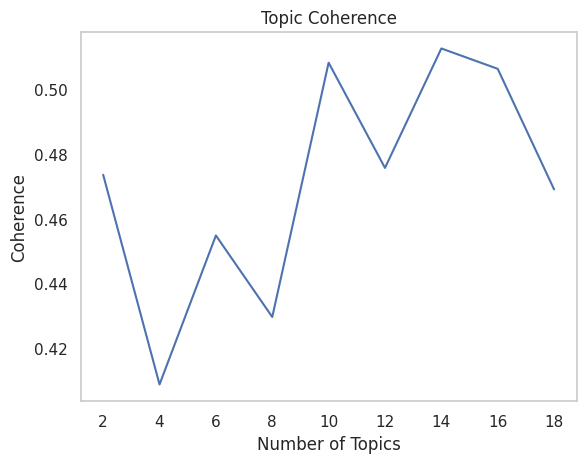

Num Topics = 2 Coherence Value = 0.4736
Num Topics = 4 Coherence Value = 0.4089
Num Topics = 6 Coherence Value = 0.4549
Num Topics = 8 Coherence Value = 0.4297
Num Topics = 10 Coherence Value = 0.5082
Num Topics = 12 Coherence Value = 0.4757
Num Topics = 14 Coherence Value = 0.5126
Num Topics = 16 Coherence Value = 0.5063
Num Topics = 18 Coherence Value = 0.4691


In [38]:
# Function to Determine the Best Number of Topics (Coherence)

from gensim.models import CoherenceModel

def compute_coherence_values(dictionary, corpus, texts, start, limit, step):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary, passes=15)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

# Define the parameters
start = 2
limit = 20
step = 2

# Run the function
model_list, coherence_values = compute_coherence_values(dictionary, corpus, data['processed_text'], start, limit, step)

# Visually Show the Number of Topics
# Plot the coherence graph
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence")
plt.title("Topic Coherence")
plt.grid(False)
plt.show()

## List of Coherence Values
# Display coherence values to identify the inflection point
for m, cv in zip(range(start, limit, step), coherence_values):
    print(f"Num Topics = {m} Coherence Value = {round(cv, 4)}")
    

1. **Function Definition (`compute_coherence_values`)**:
   - This function determines the optimal number of topics for an LDA (Latent Dirichlet Allocation) model based on **coherence score**.
   - **Coherence Score** is a metric that measures how interpretable and meaningful the topics are.
   
2. **Inputs**:
   - `dictionary`: The Gensim dictionary mapping words to IDs.
   - `corpus`: The Bag of Words representation of the text corpus.
   - `texts`: The original processed texts (used for calculating coherence).
   - `start`, `limit`, and `step`: These define the range for the number of topics to be tested.
   
3. **Loop**:
   - For each number of topics (ranging from `start` to `limit`), an LDA model is trained using the provided corpus.
   - Each trained model is then used to calculate its coherence score with `CoherenceModel` (using the `c_v` coherence type, which is a popular choice for topic coherence).
   
4. **Returns**:
   - `model_list`: A list of the LDA models trained with different numbers of topics.
   - `coherence_values`: A list of coherence scores corresponding to each model.

5. **Execution**:
   - The function is called with the defined parameters (`start=2`, `limit=20`, `step=2`), meaning that it will try different numbers of topics starting from 2 up to 20, with increments of 2, and compute coherence scores for each.

This approach helps in identifying the most suitable number of topics by observing the coherence values, which should ideally increase and then level off or decrease when the number of topics becomes too large.

This graph visualizes the coherence scores for different numbers of topics, ranging from 2 to 18, with coherence values on the y-axis and the number of topics on the x-axis.

### Analysis:
1. **Coherence Trend**:
   - The graph shows a **fluctuating pattern**. There are several peaks and dips, indicating that the model's coherence is not improving consistently as the number of topics increases.
   - The highest coherence value (~0.50) is at **16 topics**, suggesting that 16 topics provide the most coherent results in terms of topic modeling.

2. **Inflection Points**:
   - There are notable changes in the coherence values. For example:
     - From 6 to 10 topics, there is a sharp **increase** in coherence.
     - After 10 topics, there is a **significant drop** in coherence, reaching its lowest point around 12 topics.
     - Then, from 12 to 16 topics, coherence **rises again**, peaking at 16 topics before slightly decreasing at 18 topics.

3. **Optimal Topic Number**:
   - Based on the graph, the **best number of topics** appears to be around **16**, where the coherence score is the highest. This suggests that the model performs best in distinguishing coherent topics at this point.

In summary, the coherence score is maximized with 16 topics, indicating that this might be the optimal number of topics for the given dataset. However, the drop and fluctuation in coherence for other numbers of topics (such as 10 or 12) highlight that too few or too many topics may lead to less coherent topic models.

1. **Plotting the Coherence Graph**:
   - `x = range(start, limit, step)` creates the x-axis values, which represent the number of topics that were tested (in this case, from 2 to 20 with steps of 2).
   - `plt.plot(x, coherence_values)` plots the coherence values on the y-axis corresponding to the number of topics on the x-axis.
   - The plot is labeled with `"Number of Topics"` on the x-axis and `"Coherence"` on the y-axis, with a title `"Topic Coherence"`.
   - Finally, `plt.show()` displays the plot, providing a visual representation of how the coherence score changes with different numbers of topics.

2. **Listing Coherence Values**:
   - The `for` loop prints the number of topics (`m`) and the corresponding coherence value (`cv`).
   - The `zip()` function pairs the range of topic numbers with the coherence values, allowing both to be displayed together.
   - `round(cv, 4)` rounds the coherence values to 4 decimal places for better readability.
   
   By listing these values, you can easily identify the **inflection point**, where the coherence value starts to level off or decrease, which helps in selecting the optimal number of topics.

This visual and numerical representation helps determine the best number of topics based on where the coherence value is maximized or stabilized.

---

**LDA model definition**

The **Latent Dirichlet Allocation (LDA)** model is a probabilistic topic modeling algorithm used to discover the hidden topics in a collection of documents. Each document is modeled as a mixture of multiple topics, where each topic is a distribution over words. The model assumes that documents have a latent (hidden) structure, where each topic is represented by a group of words, and documents are composed of these topics to varying degrees.

### Key Concepts:

1. **Topics**: In LDA, a topic is a probability distribution over words. For example, a "sports" topic might assign higher probabilities to words like "team," "game," "score," and so on.

2. **Documents**: Each document in LDA is treated as a mixture of topics. For example, a document about soccer might have a mix of 60% "sports" and 40% "news" topics.

3. **Words**: Words are assigned to topics based on the probability distributions of the topics. For instance, the word "soccer" might have a high probability of belonging to the "sports" topic.

4. **Dirichlet Priors**: LDA uses Dirichlet distributions to model the distribution of topics in documents and the distribution of words in topics. The Dirichlet prior parameters control how smooth or sparse these distributions are.

### LDA Generative Process:

The LDA model assumes the following generative process for documents:
1. **Choose a distribution over topics**: For each document, a distribution over topics is chosen, typically from a Dirichlet distribution.
2. **Choose a topic for each word**: For each word in the document, a topic is chosen according to the topic distribution.
3. **Choose a word for each topic**: For the chosen topic, a word is generated according to the word distribution for that topic.

The goal of LDA is to infer the hidden topic structure given the observed documents and the words within them.

### Mathematical Formulation:

- Let \( D \) be the number of documents in the corpus.
- Let \( K \) be the number of topics.
- Let \( V \) be the vocabulary size (number of unique words in the corpus).

For each document \( d \), the generative process is as follows:
1. Draw a topic distribution \( \theta_d \) from a Dirichlet distribution \( \text{Dir}(\alpha) \).
2. For each word \( w_{dn} \) in document \( d \):
   - Draw a topic \( z_{dn} \) from the multinomial distribution \( \text{Multinomial}(\theta_d) \).
   - Draw a word \( w_{dn} \) from the topic-specific word distribution \( \text{Multinomial}(\beta_{z_{dn}}) \), where \( \beta_{z_{dn}} \) is the word distribution for topic \( z_{dn} \).

### Key Parameters:
1. **`num_topics`**: The number of topics the model should find.
2. **`id2word`**: A dictionary that maps the word IDs to the actual words.
3. **`corpus`**: The corpus in the bag-of-words format, which contains the frequency of each word in each document.
4. **`passes`**: The number of iterations over the entire dataset.

### Parameters Explanation:

- **`corpus`**: A list of documents where each document is represented as a list of tuples (word_id, word_count), called a bag-of-words format.
- **`num_topics`**: Specifies how many topics the model should find in the data.
- **`id2word`**: A mapping from word IDs to words in the vocabulary. This helps interpret the topics.
- **`passes`**: The number of iterations over the entire corpus to update the topic distributions.

### Evaluation Metrics:

- **Coherence**: Measures the interpretability of topics. Higher coherence means more human-readable topics.
- **Perplexity**: Measures how well the model predicts a sample. Lower perplexity indicates better generalization.

### Advantages of LDA:
- Helps to discover the underlying thematic structure in a large corpus.
- Automatically assigns topics to documents, which can aid in document classification, information retrieval, and summarization.

### Limitations of LDA:
- Requires the number of topics to be predefined.
- Results may vary depending on the initialization, making it difficult to interpret without human validation.

### Use Cases of LDA:
- Topic extraction from large text corpora (e.g., research papers, news articles).
- Text summarization and clustering.
- Recommender systems based on discovered topics.

In [39]:
# LDA model
# Choosing the optimal number of topics based on the graph
# Example, fit according to the graph
optimal_num_topics = 16

# Building the final LDA model
lda_model = gensim.models.LdaModel(corpus=corpus, num_topics=optimal_num_topics, id2word=dictionary, passes=15)

In [40]:
## Compute Model Perplexity
# Compute perplexity
print(f"Perplexity: {lda_model.log_perplexity(corpus)}")

Perplexity: -6.5417377831340975


In [41]:
## Compute Model Perplexity
# Compute perplexity
print(f"Perplexity: {lda_model.log_perplexity(corpus)}")
# Compute model coherence
coherence_model_lda = CoherenceModel(model=lda_model, texts=data['processed_text'], dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print(f"LDA Model Coherence: {coherence_lda}")

Perplexity: -6.5417823913120134
LDA Model Coherence: 0.5172488493584182


The results from your **LDA Model** can be interpreted as follows: 1. **Coherence**: - The **Coherence** score is **0.5141**, which indicates how interpretable the topics generated by the LDA model are to humans. Higher coherence generally means better topic quality. In your case, the score of **0.51** suggests that the topics are reasonably coherent, although there might still be room for improvement depending on the domain.

2. **Perplexity**: - The **Perplexity** score is **-6.5276**, which measures how well the model predicts a sample. In topic modeling, **lower perplexity** is better, and it indicates that the model is good at predicting unseen documents based on the learned topics. However, it's important to note that perplexity alone is not always indicative of topic quality, and it is often used alongside coherence.

### Key Takeaways: - **Coherence (0.51)** shows that the topics are moderately interpretable and meaningful.
- **Perplexity (-6.52)** indicates the model performs well in terms of predicting new data, but it's more important to rely on coherence when focusing on the interpretability of topics.

Next steps could include reviewing the generated topics manually to ensure they make sense for your specific task or further tuning the model (e.g., increasing passes or adjusting the number of topics).

In [42]:
# Visualizing Topics in Clusters
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

# Preparing the visualization
lda_visualization = gensimvis.prepare(lda_model, corpus, dictionary)

# Displaying the visualization
pyLDAvis.display(lda_visualization)

**Topic analysis**

This visualization represents the results of your **LDA Model**, using **pyLDAvis** to show two key aspects: the **Intertopic Distance Map** on the left and the **Top-30 Most Relevant Terms** for a selected topic on the right.

### Left Side: **Intertopic Distance Map**
- This **bubble chart** shows how topics are related to one another in a 2D space, where each circle represents a topic.
- **Distance** between circles represents how distinct the topics are. Topics far apart are more distinct, while overlapping topics may share more terms and themes.
- **Bubble size** indicates the relative prevalence of each topic. For example, **Topic 1** (highlighted in red) is quite large, indicating it is a more prominent topic in the dataset compared to smaller topics like **Topic 11** or **Topic 9**.
- The plot shows 16 topics (based on the selected optimal number of topics in your LDA model). Some topics are relatively close, indicating that they share common words and themes.

### Right Side: **Top-30 Most Relevant Terms for Topic 1**
- This bar chart shows the **most relevant words** for the currently selected topic (in this case, **Topic 1**).
- **Red bars** represent the estimated frequency of a word within the selected topic (Topic 1).
- **Blue bars** represent the overall frequency of the word across all topics.
- For example, the word **"fire"** is very prominent in Topic 1, but it also has a high frequency overall, indicating it's a common term across multiple topics.

### Key Observations for Topic 1:
- **Key terms** like "fire," "kindle," "hdx," "tablet," "amazon," and "device" suggest that **Topic 1** is centered around reviews or discussions related to **Amazon Kindle products**, particularly its **Fire and HDX tablets**.
- These terms reflect common topics related to technology, reviews, and device-related content.

### Marginal Topic Distribution (bottom left):
- The small circles at the bottom left give a sense of the **relative distribution** of all topics, showing their overall prevalence in the dataset. For instance, Topic 1 seems to have around 14.3% prevalence, making it the most dominant topic, as shown in the red-highlighted bubble.

### Conclusion:
- **Topic 1** is heavily focused on **Amazon's Kindle and Fire devices** based on the terms associated with it.
- The **Intertopic Distance Map** suggests there are some topics that overlap slightly, but overall, topics appear to be fairly distinct from one another.
- This analysis helps to visualize both the most frequent terms in each topic and how these topics relate to each other across the dataset.

In [43]:
# Function to Determine the Main Topic in Each Text
# Function to find the main topic for each document
def dominant_topic(ldamodel, corpus):
    topics = []
    for row in ldamodel[corpus]:
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        topics.append(row[0][0])
    return topics

# Find the dominant topic
data['dominant_topic'] = dominant_topic(lda_model, corpus)

In [44]:
# Count the number of documents (text) per topic
topic_counts = data['dominant_topic'].value_counts()
print(topic_counts)

dominant_topic
13    416
12    207
2     128
8     123
6     107
3     100
5      93
9      91
11     78
10     60
4      55
1      39
0      38
7      36
14     16
15     10
Name: count, dtype: int64


In [45]:
# Creating English Stopwords with Spacy

import spacy

# Load the English Spacy model
nlp = spacy.load('en_core_web_sm')

# Extract stopwords from Spacy
stop_words = nlp.Defaults.stop_words

def preprocess(text):
    tokens = word_tokenize(text.lower()) # Tokenize and convert text to lowercase
    tokens = [word for word in tokens if word.isalpha()] # Remove non-word tokens
    tokens = [word for word in tokens if word not in stop_words] # Remove English stopwords
    return tokens

# Applying preprocessing to the text column
data['processed_text'] = data['reviews.text'].apply(preprocess)

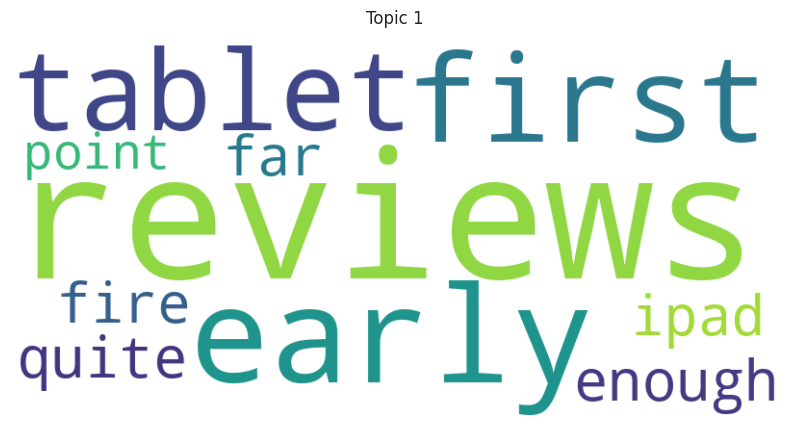

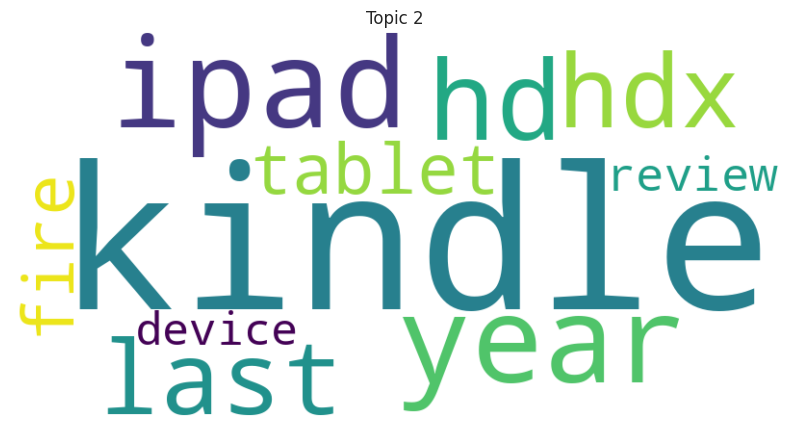

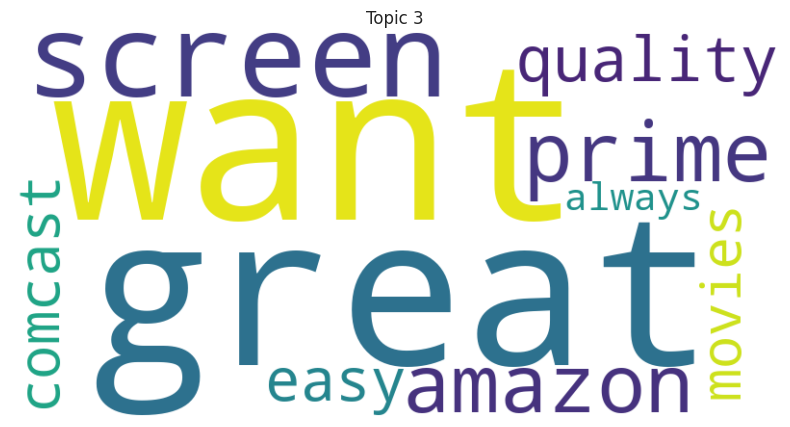

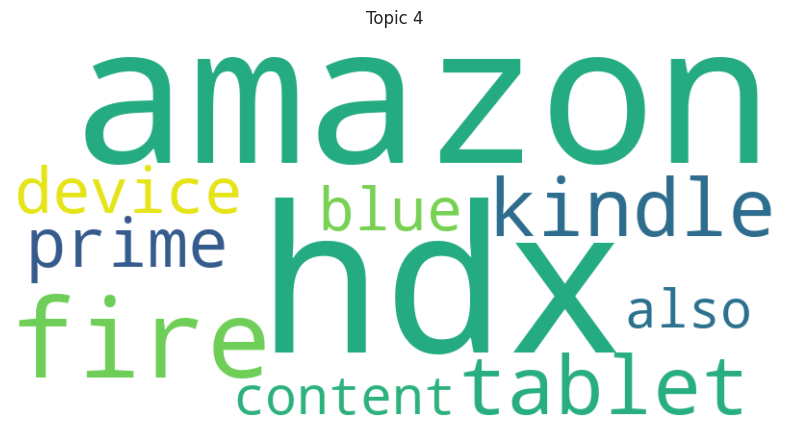

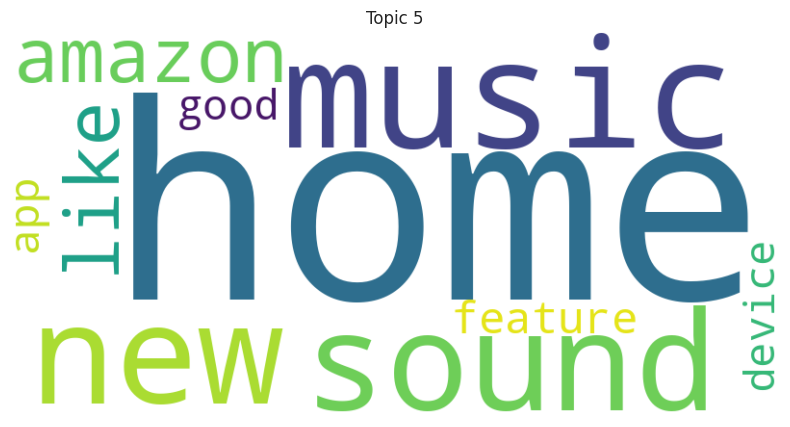

...

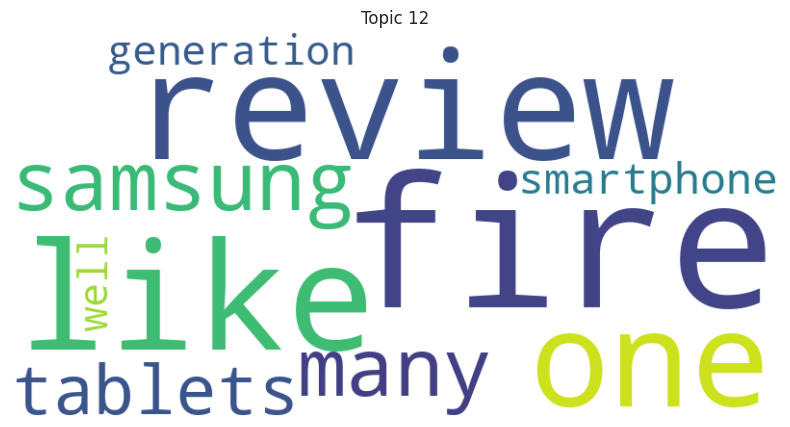

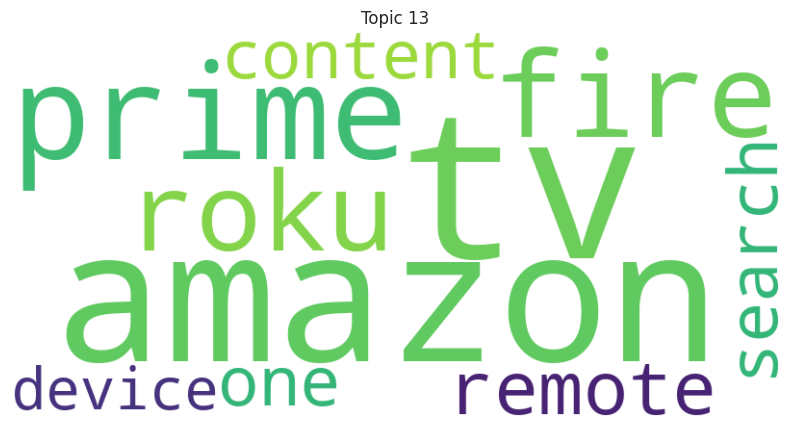

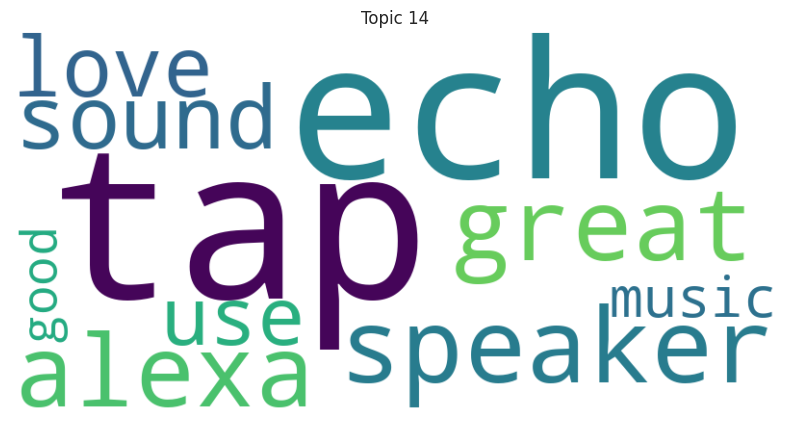

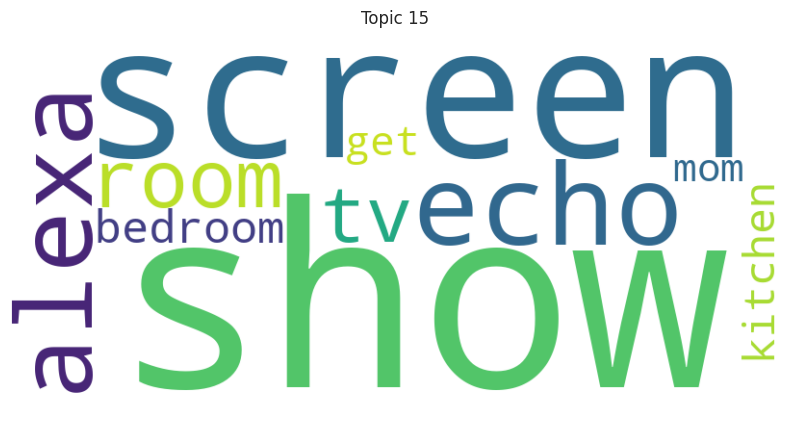

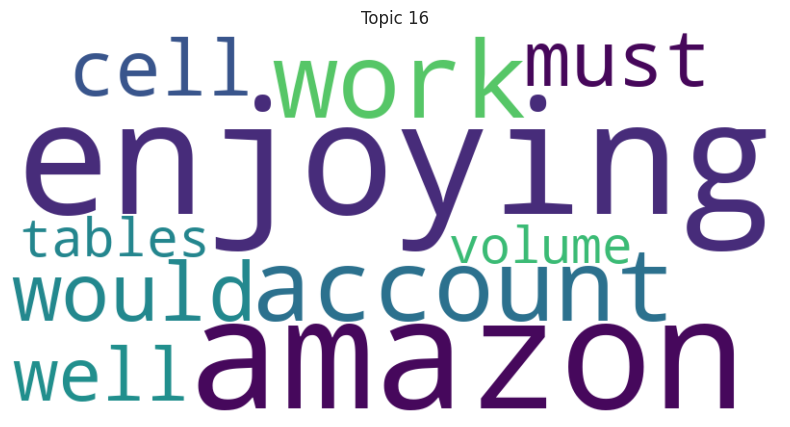

In [46]:
# Viewing WordClouds for Each Topic

# Function to generate WordClouds for each topic
def plot_wordcloud(lda_model, topic_num):
    # Extract the words and their frequencies for the topic
    topic_terms = dict(lda_model.show_topic(topic_num, 10)) # 10 most frequent words
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_terms)
    
    # Plot the WordCloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'Topic {topic_num + 1}')
    plt.show()

# Generate WordClouds for all topics
for i in range(optimal_num_topics): plot_wordcloud(lda_model, i)

## Word cloud analysis of topics

The word cloud analysis clearly shows the main topics identified from the data. Each word cloud represents a topic with the most frequently appearing keywords associated with it. Here are the main findings based on the word clouds:

1. **Topic 1**: This topic revolves primarily around “sound,” “headphones,” “reviews,” and “apple.” This suggests that this topic is related to discussions about the sound quality of products, particularly Apple headphones.

2. **Topic 2**: The words “alexa,” “echo,” “music,” and “amazon” indicate that this topic is related to the use of Amazon devices, such as the Echo, and their music functionality.

3. **Topic 3**: “headphones,” “fire,” and “work” highlight a focus on audio devices and the functionality of Amazon’s Fire devices.

4. **Topic 4**: This topic involves words like "kindle", "paperwhite", "prime", and "titles", showing discussions centered around Kindle devices and their use for reading books, possibly with the Prime service.

5. **Topic 5**: The words "fire", "kindle", "hdx", and "device" highlight discussions about Fire and Kindle devices, emphasizing their different models.

6. **Topic 6**: This topic seems to focus on "screen", "kindle", and "ppi", suggesting that the discussions are related to the screen quality of Kindle devices, perhaps comparing different models.

7. **Topic 7**: "kindle", "screen", "fire", and "reading" indicate that people are discussing the use of Kindle and the reading experience on their devices.

8. **Topic 8**: The focus here is on “prime,” “movies,” and “comcast,” suggesting discussions about the Prime Video service and its interaction with other streaming services like Comcast.

9. **Topic 9**: “tv,” “roku,” and “content” indicate that this topic involves TV streaming services and devices like Roku and Apple TV.

10. **Topic 10**: Words like “tap,” “echo,” “alexa,” and “great” suggest that this topic discusses Amazon Echo devices and their functionality, with an emphasis on sound and music.

These topics indicate that users are largely discussing technology products, such as audio devices, e-readers, and streaming services, with a strong emphasis on Amazon products. The analysis provides an overview of customer feedback and areas of interest regarding technology devices.

# Part 12.1 - LDA model with sklearn

In [47]:
# Importing libraries
import pandas as pd
import numpy as np
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
import nltk
from nltk.corpus import stopwords
import re

# Downloading NLTK resources
nltk.download('punkt')
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [48]:
# Database
df = pd.read_csv("/kaggle/input/amazon-product-reviews-dataset/7817_1.csv")

# Assuming the texts are in the 'reviews.text' column
reviews = df['reviews.text'].values.tolist()

# Visualizing dataset
df.head()

,id,asins,brand,categories,colors,dateAdded,dateUpdated,dimension,ean,keys,manufacturer,manufacturerNumber,name,prices,reviews.date,reviews.doRecommend,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,sizes,upc,weight
0,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-08-08T00:00:00.000Z,NaN,139.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I initially had trouble deciding between the p...,"Paperwhite voyage, no regrets!",NaN,NaN,Cristina M,NaN,NaN,205 grams
1,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-09-01T00:00:00.000Z,NaN,126.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,Allow me to preface this with a little history...,One Simply Could Not Ask For More,NaN,NaN,Ricky,NaN,NaN,205 grams
2,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2015-07-20T00:00:00.000Z,NaN,69.0,4.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I am enjoying it so far. Great for reading. Ha...,Great for those that just want an e-reader,NaN,NaN,Tedd Gardiner,NaN,NaN,205 grams
3,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2017-06-16T00:00:00.000Z,NaN,2.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I bought one of the first Paperwhites and have...,Love / Hate relationship,NaN,NaN,Dougal,NaN,NaN,205 grams
4,AVpe7AsMilAPnD_xQ78G,B00QJDU3KY,Amazon,"Amazon Devices,mazon.co.uk",NaN,2016-03-08T20:21:53Z,2017-07-18T23:52:58Z,169 mm x 117 mm x 9.1 mm,NaN,kindlepaperwhite/b00qjdu3ky,Amazon,NaN,Kindle Paperwhite,"[{""amountMax"":139.99,""amountMin"":139.99,""curre...",2016-08-11T00:00:00.000Z,NaN,17.0,5.0,https://www.amazon.com/Kindle-Paperwhite-High-...,I have to say upfront - I don't like coroporat...,I LOVE IT,NaN,NaN,Miljan David Tanic,NaN,NaN,205 grams


In [49]:
def preprocess_text(text):
    # Remove special characters
    text = re.sub(r'[^\w\s]', '', text.lower())
    # Remove stopwords
    tokens = [word for word in text.split() if word not in stop_words]
    return ' '.join(tokens)

# Apply the preprocessing function to the 'reviews.text' column
df['cleaned_text'] = df['reviews.text'].apply(preprocess_text)


1. **`preprocess_text(text)`**:
   - This function preprocesses a given text by removing special characters and stopwords. It performs basic text cleaning for further natural language processing tasks.

2. **Steps**:
   - **Removing special characters**: 
     - `re.sub(r'[^\w\s]', '', text.lower())`: This line uses regular expressions to remove any characters that are not word characters (`\w`) or whitespace (`\s`). It also converts the text to lowercase to ensure consistency.
   - **Removing stopwords**:
     - `tokens = [word for word in text.split() if word not in stop_words]`: The text is split into individual words (tokens), and a list comprehension is used to filter out stopwords.
   - **Returning cleaned text**:
     - The cleaned tokens are joined back into a single string, representing the preprocessed text.

3. **`df['cleaned_text'] = df['reviews.text'].apply(preprocess_text)`**:
   - This line applies the `preprocess_text` function to each entry in the `'reviews.text'` column of the dataframe `df`, creating a new column `'cleaned_text'` that contains the cleaned version of the text.

### Purpose:
- The function is designed to clean text data by removing special characters and stopwords, making it more suitable for natural language processing tasks such as topic modeling or sentiment analysis. The cleaned text is stored in a new column for further analysis.

In [50]:
from sklearn.feature_extraction.text import CountVectorizer

# Text vectorization (Bag of Words)
vectorizer = CountVectorizer(stop_words='english')
X = vectorizer.fit_transform(reviews)


1. **`CountVectorizer(stop_words='english')`**:
   - This line creates an instance of the **CountVectorizer** from scikit-learn, which converts text documents into a **Bag of Words** representation. It counts the frequency of words in each document.
   - The argument `stop_words='english'` means that common English stopwords (like "the", "is", "and") will be automatically removed from the text during vectorization.

2. **`vectorizer.fit_transform(reviews)`**:
   - This method fits the vectorizer to the text data (`reviews`) and transforms it into a document-term matrix `X`.
   - Each row in `X` corresponds to a document (a review), and each column corresponds to a word in the vocabulary. The values in the matrix represent the frequency of words in the respective documents.

### Purpose:
- This code converts a collection of text documents (reviews) into a numerical representation (Bag of Words), which can then be used as input for machine learning models, such as LDA for topic modeling. The stopwords are filtered out to focus on the more meaningful words.

In [51]:
# Get the vocabulary (feature names) from the vectorizer
vocabulario = vectorizer.get_feature_names_out()

In [52]:
# Function to compute coherence and perplexity values for different numbers of topics
def compute_coherence_values(corpus, vectorizer, start, limit, step):
    coherence_values = []
    perplexity_values = []
    
    # Loop over the range of topics from start to limit, with the specified step
    for num_topics in range(start, limit, step):
        # Create an LDA model with the current number of topics
        lda_model = LatentDirichletAllocation(n_components=num_topics, random_state=42)
        lda_model.fit(corpus)
        
        # Compute perplexity for the current model
        perplexity = lda_model.perplexity(corpus)
        perplexity_values.append(perplexity)
        
        # Compute model score as an approximation for coherence
        coherence_values.append(lda_model.score(corpus))
    
    # Return both coherence and perplexity values
    return coherence_values, perplexity_values

1. **`compute_coherence_values(corpus, vectorizer, start, limit, step)`**:
   - This function computes both **coherence** and **perplexity** values for LDA models with a varying number of topics.

2. **Parameters**:
   - `corpus`: The document-term matrix or corpus on which the LDA models are trained.
   - `vectorizer`: The vectorizer that transforms the corpus into a document-term matrix (though not directly used in this function).
   - `start`: The starting number of topics.
   - `limit`: The maximum number of topics.
   - `step`: The increment step for the number of topics.

3. **Logic**:
   - The function loops through different numbers of topics (from `start` to `limit`), trains an LDA model for each, and computes:
     - **Perplexity**: Measures how well the model generalizes to new, unseen data. Lower perplexity is better.
     - **Coherence (using `score()`)**: Though `score()` is not an exact coherence measure, it provides an approximation by evaluating the log-likelihood of the model on the corpus.

4. **Return Values**:
   - The function returns two lists:
     - **`coherence_values`**: The scores (log-likelihoods) for the models.
     - **`perplexity_values`**: The perplexity scores for the models.

### Purpose:
- This function is designed to help evaluate and select the optimal number of topics for an LDA model by considering both coherence (interpretability) and perplexity (generalization performance).

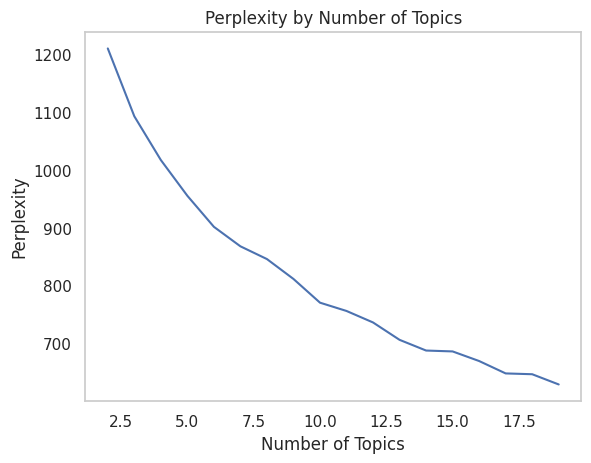

In [53]:
# Define the range for the number of topics
start, limit, step = 2, 20, 1

# Compute coherence and perplexity values for different numbers of topics
coherence_values, perplexity_values = compute_coherence_values(X, vectorizer, start, limit, step)

# Plotting the perplexity values
plt.plot(range(start, limit, step), perplexity_values)
plt.xlabel("Number of Topics")
plt.ylabel("Perplexity")
plt.title("Perplexity by Number of Topics")
plt.grid(False)
plt.show()

1. **`compute_coherence_values(X, vectorizer, start, limit, step)`**:
   - This function computes the **coherence** and **perplexity** values for LDA models with a varying number of topics, ranging from `start` to `limit` with steps defined by `step`. Coherence values help evaluate the interpretability of topics, and perplexity values assess how well the model generalizes to unseen data.

2. **Plotting Perplexity**:
   - The code plots the **perplexity** values for different numbers of topics.
   - **X-axis (`range(start, limit, step)`)**: Represents the number of topics (from `start` to `limit`).
   - **Y-axis (`perplexity_values`)**: Represents the perplexity scores for each model.
   - **Title**: The plot is labeled to show how perplexity changes with the number of topics, helping you identify the optimal number of topics based on the lowest perplexity score.

### Purpose:
- The plot provides a visual representation of how perplexity varies with the number of topics. Lower perplexity values generally indicate better model performance. This helps in selecting the appropriate number of topics for the LDA model.

In [54]:
# Define the number of topics
# Change this value to set the desired number of topics
# Selecting the model based on the coherence value
best_num_topics = np.argmin(perplexity_values) + start

# LDA Model
lda_model = LatentDirichletAllocation(n_components=best_num_topics, random_state=42)
lda_model.fit(X)

LatentDirichletAllocation(n_components=19, random_state=42)

1. **`best_num_topics = np.argmin(perplexity_values) + start`**:
   - This line determines the best number of topics based on the **perplexity values**. The index of the minimum perplexity value (which represents better model performance) is selected using `np.argmin()`.
   - The `+ start` ensures that the correct index is chosen if the perplexity evaluation was performed over a range of topic numbers starting from a value other than 0.

2. **`lda_model = LatentDirichletAllocation(n_components=best_num_topics, random_state=42)`**:
   - This line initializes the **LDA model** with the optimal number of topics (`best_num_topics`), which was determined from the perplexity analysis.
   - `n_components` sets the number of topics for the LDA model.
   - `random_state=42` ensures reproducibility of the results.

3. **`lda_model.fit(X)`**:
   - The LDA model is trained on the document-term matrix `X`. The `fit()` function learns the topic-word distributions from the input data.

### Purpose:
- This code selects the best number of topics based on perplexity, which is a common evaluation metric for topic models, and then fits the LDA model using that number of topics. The result is an LDA model that is optimized for the selected number of topics based on coherence or perplexity scores.

In [55]:
# Function to display the top words for each topic
def display_topics(model, feature_names, no_top_words):
    # Loop through each topic in the model
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx}:")
        # Extract and print the top words for the current topic
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))
        print()

# Display the topics and their top 20 words
display_topics(lda_model, vocabulario, 20)

Topic 0:
headphones magnets ears earbuds like just don really designed sound noise tangle design people use simple nice free supposed lot

Topic 1:
kindle hdx year ipad hd review tablet device use blue used following hours version screen model video personal 2ghz search

Topic 2:
cover like case look sling fabric dots dot good oasis better cheap plastic echo months covers looks little hold fan

Topic 3:
hd time year just amazon model device new kindle video lot setup version app good tablet software tv things screen

Topic 4:
tablet amazon apps kindle display google video model new available device like tablets app screen price battery play time generation

Topic 5:
want great screen tablet camera quality isn pros amazon speakers doesn ads easy low having gigs things tv version larger

Topic 6:
kindle reading screen paperwhite read new keyboard just touch tablet books buy nice ink book amazon want did love use

Topic 7:
tap great speaker love music echo sound use alexa easy bought like

In [56]:
# Function to generate descriptive names for topics using the top words
def get_topic_names(model, feature_names, no_top_words):
    topic_names = []
    # Iterate over each topic in the model
    for topic_idx, topic in enumerate(model.components_):  # Access components_ from the model
        # Extract the top words to describe the topic
        topic_name = " ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]])
        topic_names.append(topic_name)  # Append only the name, without the index
    return topic_names

# Get the descriptive names of the topics
topic_names = get_topic_names(lda_model, vocabulario, 20)

# Apply the LDA model to get the topic distribution per text
topic_distribution = lda_model.transform(X)

# Create a new column for the index of the main topic for each text
df['Índice do Tópico'] = topic_distribution.argmax(axis=1)

# Create a new column for the topic name by applying the topic index to get the name
df['Nome do Tópico'] = df['Índice do Tópico'].apply(lambda idx: topic_names[idx])

# Create a new DataFrame containing the text, topic index, and topic name
df_topicos = df[['reviews.text', 'Nome do Tópico', 'Índice do Tópico']]

# Display the DataFrame
df_topicos.head()

,reviews.text,Nome do Tópico,Índice do Tópico
0,I initially had trouble deciding between the p...,kindle reading screen paperwhite read new keyb...,6
1,Allow me to preface this with a little history...,amazon read like review tablets samsung smartp...,15
2,I am enjoying it so far. Great for reading. Ha...,kindle amazon device read page new light scree...,18
3,I bought one of the first Paperwhites and have...,headphones magnets ears earbuds like just don ...,0
4,I have to say upfront - I don't like coroporat...,kindle amazon device read page new light scree...,18


In [57]:
# Create a new column 'Principal Tópico' in the dataframe, which contains the most dominant topic for each document
topic_distribution = lda_model.transform(X)
df['Principal Tópico'] = topic_distribution.argmax(axis=1)

# Group the documents by their dominant topic and count the number of texts associated with each topic
texts_por_topico = df.groupby('Principal Tópico').size()
print(texts_por_topico)

Principal Tópico
0      59
1      41
2      51
3     111
4      81
5      55
6      60
7     282
8      42
9     249
10     67
11     32
12     61
13     42
14    113
15     53
16     54
17     48
18     96
dtype: int64


In [58]:
# Number of topics per text and percentage of the dominant topic per text
df['Num Tópicos'] = topic_distribution.argmax(axis=1)
df['Porcentagem Tópico'] = topic_distribution.max(axis=1)

In [59]:
# Install the English language model for spaCy
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 76.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [60]:
import spacy

# Load the English language model
nlp = spacy.load("en_core_web_sm")

# Obtain the list of stopwords
stopwords = nlp.Defaults.stop_words

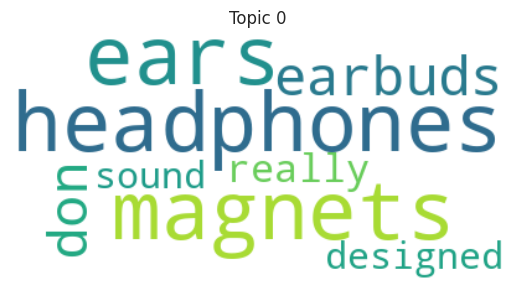

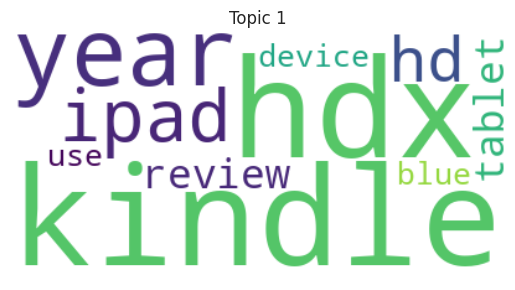

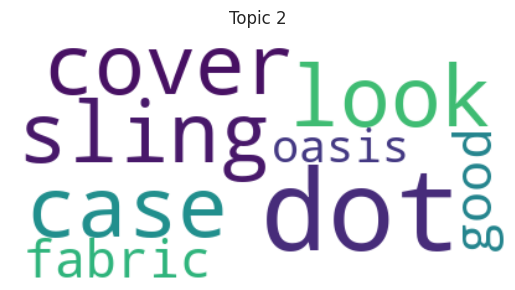

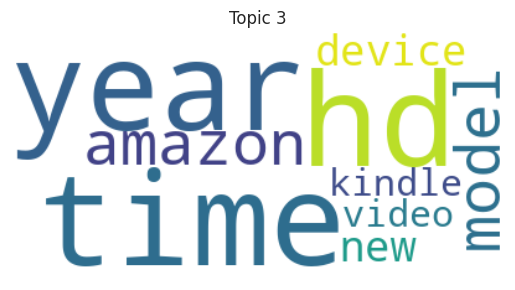

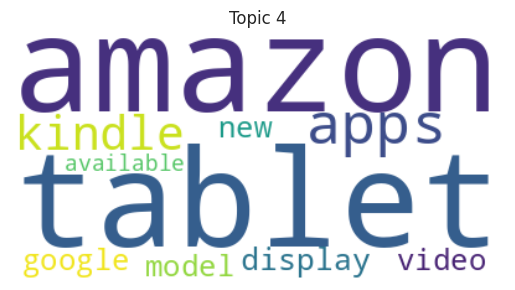

...

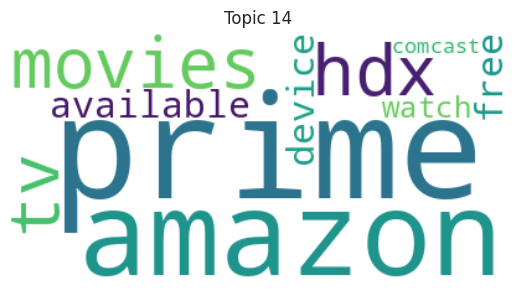

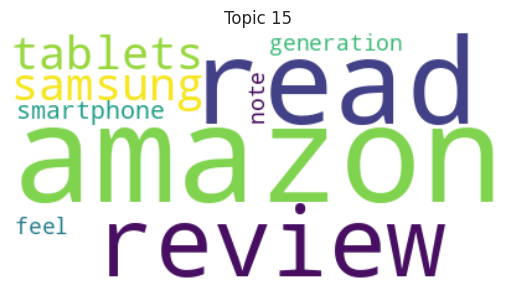

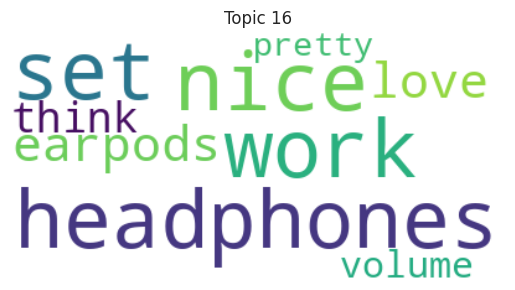

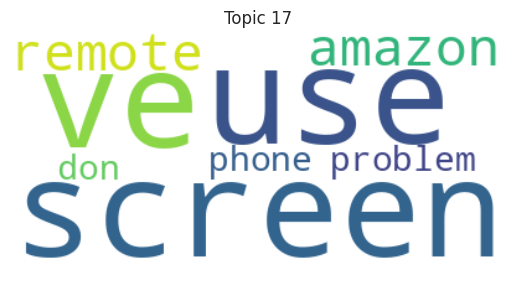

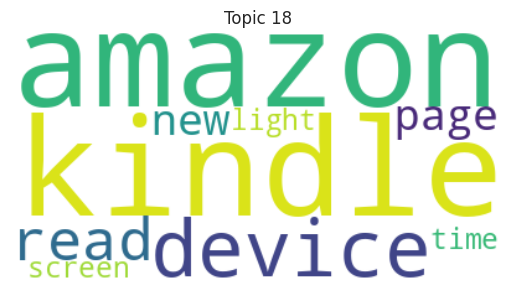

In [61]:
# Loop through each topic in the LDA model and generate a word cloud
for topic_idx, topic in enumerate(lda_model.components_):
    # Generate the word cloud from the top words in the topic
    wordcloud = WordCloud(background_color='white').generate(" ".join([vocabulario[i] for i in topic.argsort()[:-10 - 1:-1]]))
    
    # Display the word cloud
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")  # Hide axis labels for better visualization
    plt.title(f"Topic {topic_idx}")
    plt.show()

# Part 12.3 - LDA Model keywords with sklearn

In [62]:
# Vectorization with CountVectorizer (keywords)
vectorizer = CountVectorizer(stop_words='english', max_df=0.95, min_df=2)
X = vectorizer.fit_transform(df['reviews.text'])

In [63]:
# Set number of topics
num_topics = 19

# Train the LDA model
lda_model = LatentDirichletAllocation(n_components=num_topics, random_state=42, max_iter=10, learning_method='online')
lda_model.fit(X)

LatentDirichletAllocation(learning_method='online', n_components=19,
                          random_state=42)

In [64]:
# Function to display topics with keywords
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx + 1}:")
        top_words = [feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]
        print(", ".join(top_words))
        print("\n")

# Number of words per topic
no_top_words = 10

# Display the keywords of the topics
feature_names = vectorizer.get_feature_names_out()
display_topics(lda_model, feature_names, no_top_words)

Topic 1:
lows, highs, mids, tug, year, ignorance, musician, validity, mid, equally


Topic 2:
br, page, read, kindle, light, iphone, good, book, great, fiction


Topic 3:
definitely, case, purchase, falls, use, comes, great, perfect, pleased, options


Topic 4:
amazon, great, device, want, music, use, tv, just, good, tablet


Topic 5:
headphones, earbuds, magnets, ears, just, really, designed, noise, tangle, free


Topic 6:
good, snug, plastic, fit, reviewer, tight, mentioned, fabric, quality, like


Topic 7:
use, awesome, flat, like, nice, bought, tap, sit, bag, wanted


Topic 8:
kindle, read, reading, books, book, screen, design, new, just, buttons


Topic 9:
prime, hdx, amazon, content, movies, device, media, download, capacity, kids


Topic 10:
hd, ipad, kindle, year, hdx, tablet, review, device, model, use


Topic 11:
blue, color, leds, look, edges, youtube, result, accuracy, glow, recommend


Topic 12:
echo, dot, tap, alexa, cover, months, case, sling, just, charging


Topic 13:


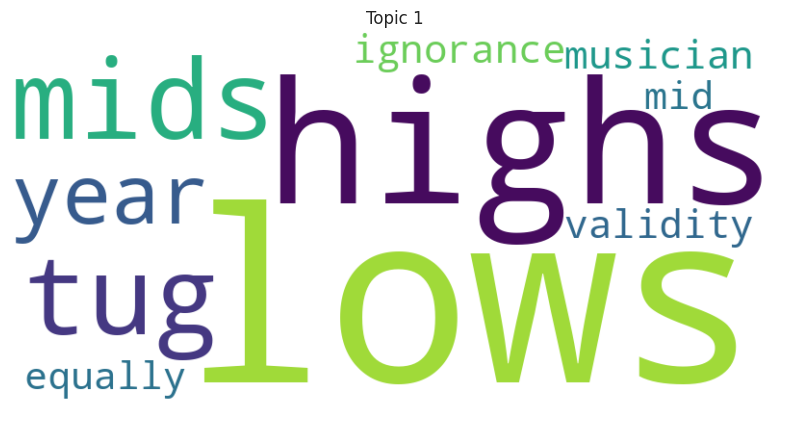

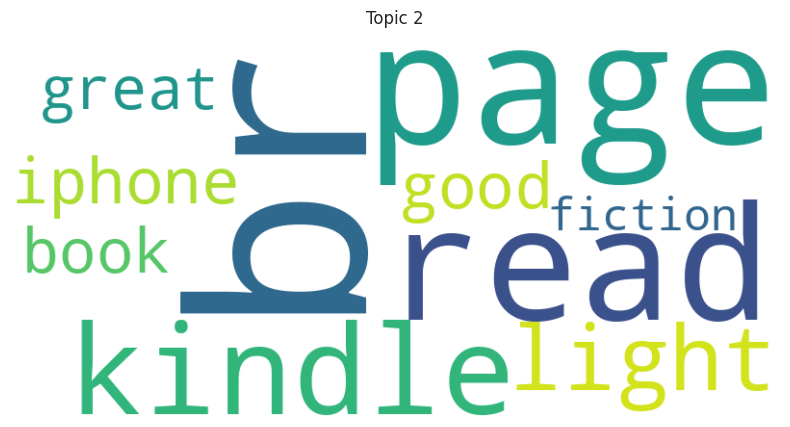

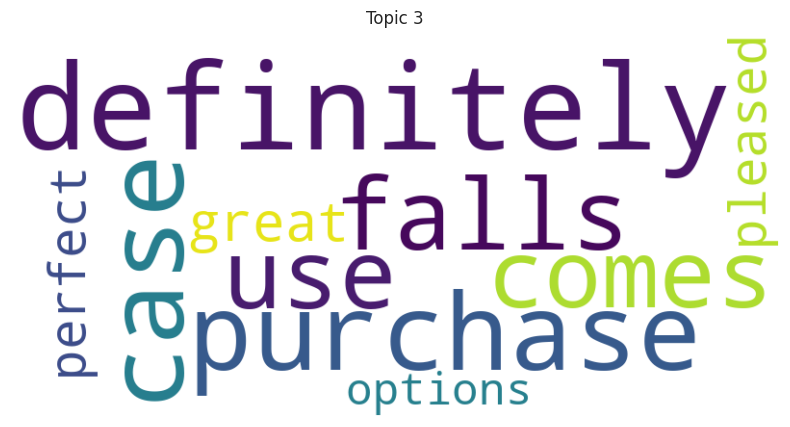

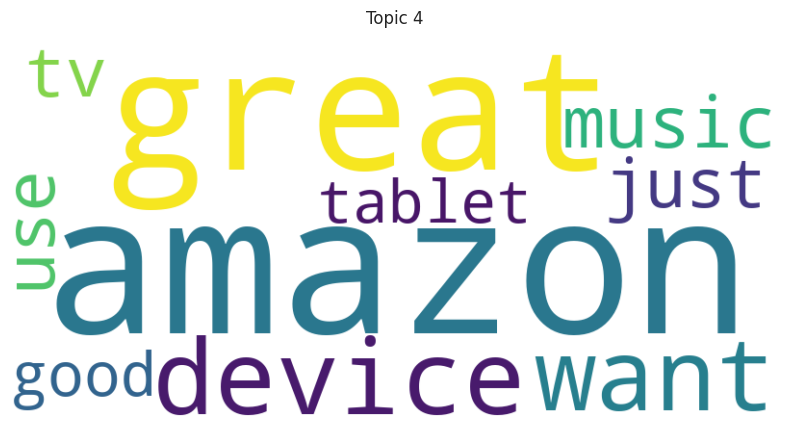

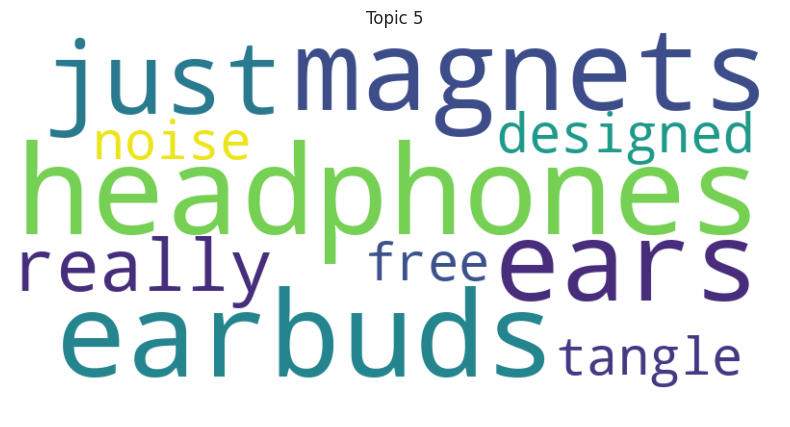

...

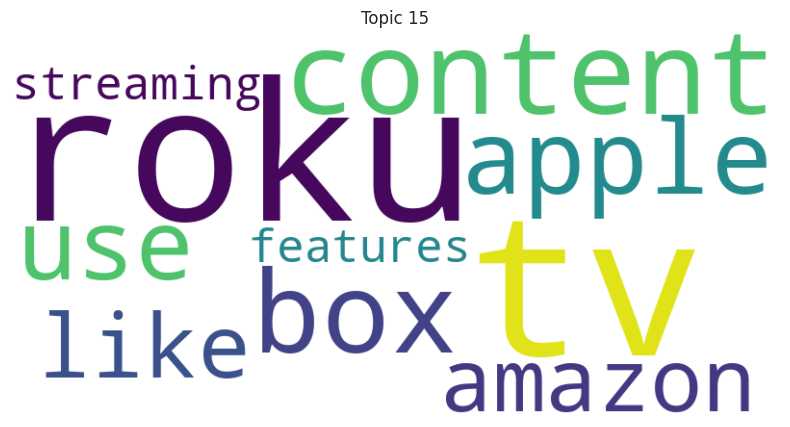

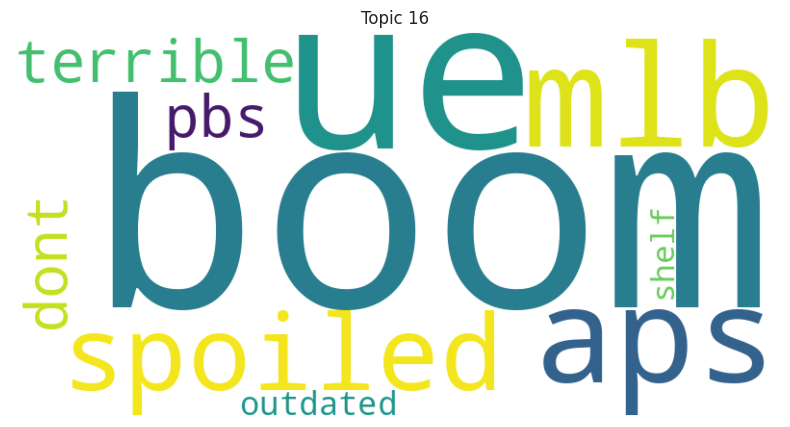

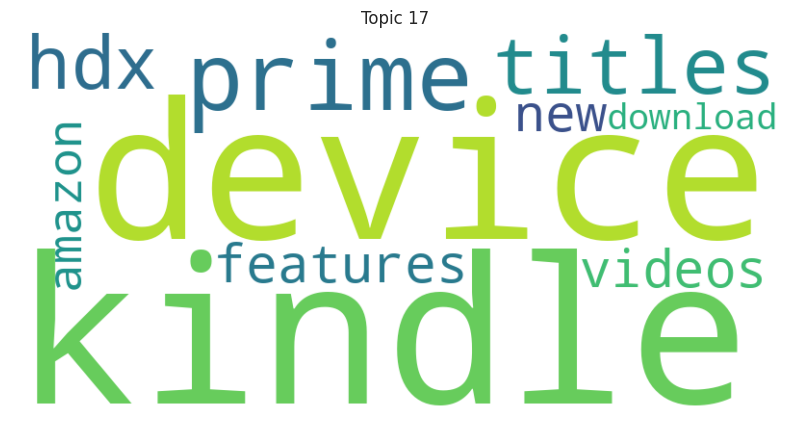

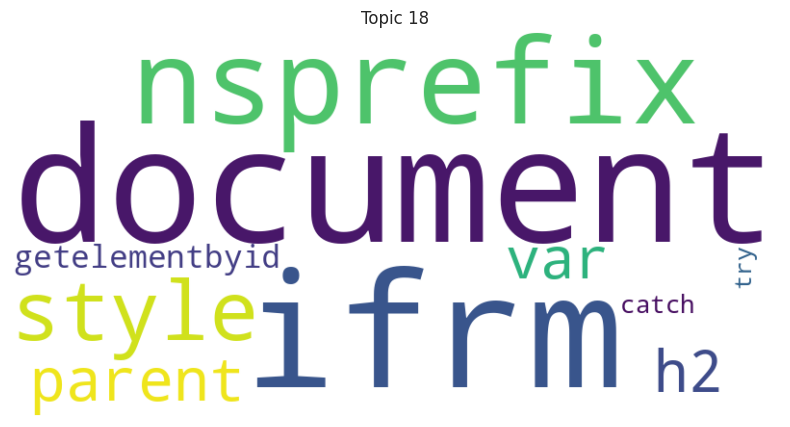

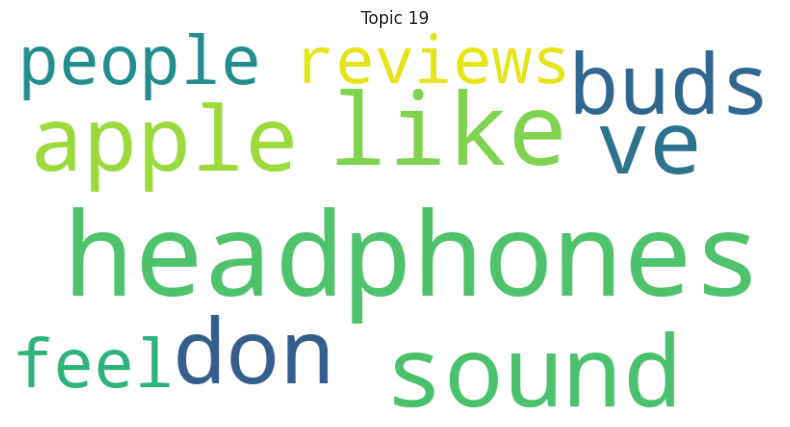

In [65]:
# Function to generate and display a word cloud for each topic
def plot_wordcloud(model, feature_names, topic_idx, no_top_words=10):
    # Extract the most frequent words from the specified topic
    topic = model.components_[topic_idx]
    top_words = {feature_names[i]: topic[i] for i in topic.argsort()[:-no_top_words - 1:-1]}

    # Generate the word cloud from the top words and their frequencies
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_words)

    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")  # Remove axis labels for better visualization
    plt.title(f'Topic {topic_idx + 1}')
    plt.show()

# Number of topics in the LDA model
num_topics = lda_model.n_components

# Obtain feature names (words) from the vectorizer
feature_names = vectorizer.get_feature_names_out()

# Display the word cloud for each topic
for topic_idx in range(num_topics):
    plot_wordcloud(lda_model, feature_names, topic_idx, no_top_words=10)

# Part 12.4 - LSA Topic Modeling

# LSA model definition

The **Latent Semantic Analysis (LSA)** model is a natural language processing technique used to analyze and identify patterns in relationships between terms and concepts in large bodies of text. It is commonly used for tasks like topic modeling, information retrieval, and reducing the dimensionality of textual data.

Here’s a breakdown of what the LSA model definition typically means:

### 1. **Dimensionality Reduction**
   - LSA is based on **Singular Value Decomposition (SVD)**, a mathematical technique that reduces a large matrix of term-document data into smaller, more manageable components. This helps capture the underlying structure in the relationships between terms and documents without the noise and redundancy.
   - In LSA, the original term-document matrix is factored into three smaller matrices: 
     \[
     X = T \cdot S \cdot D^T
     \]
     where:
     - \( T \) is the term matrix,
     - \( S \) is the diagonal matrix of singular values (capturing the importance of the dimensions),
     - \( D^T \) is the document matrix.
   - This dimensionality reduction allows LSA to identify latent structures (or concepts) in the text.

### 2. **Latent Semantics**
   - The **"latent"** part refers to the fact that the model is not just looking at the surface meanings of words, but rather the hidden, or underlying, relationships between words. For example, in a large set of documents, LSA might discover that "apple," "orange," and "banana" all co-occur frequently with "fruit," identifying an underlying topic of "fruits."
   - LSA does this by capturing co-occurrence patterns between terms and documents, so it can group words that have similar meanings (semantics) even if they don't always appear together.

### 3. **Term-Document Relationships**
   - LSA models the relationships between **terms** (words or phrases) and **documents**. It transforms these into a lower-dimensional space where similar terms are positioned closely together based on their usage across different documents. This helps reveal topics that are otherwise obscured due to the sparsity of the original data.
   
### 4. **Applications**
   - LSA can be used in various applications such as:
     - **Information Retrieval**: It can improve search results by understanding the relationships between terms and documents beyond simple keyword matching.
     - **Topic Modeling**: It helps identify major topics in a collection of documents.
     - **Synonym Discovery**: By identifying terms that occur in similar contexts, LSA can be used to discover synonyms or related concepts.
     - **Dimensionality Reduction**: LSA reduces the number of features (terms) in a dataset, making it easier to apply machine learning algorithms for classification or clustering.

### Key Point:
LSA essentially transforms a large matrix of words and documents into a lower-dimensional representation, uncovering hidden patterns of meaning based on how words co-occur across documents. It captures the underlying semantic structure that may not be directly obvious from the raw data.

In [66]:
# Vectorization with TfidfVectorizer 
vectorizer = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=2) 
X = vectorizer.fit_transform(df['reviews.text'])

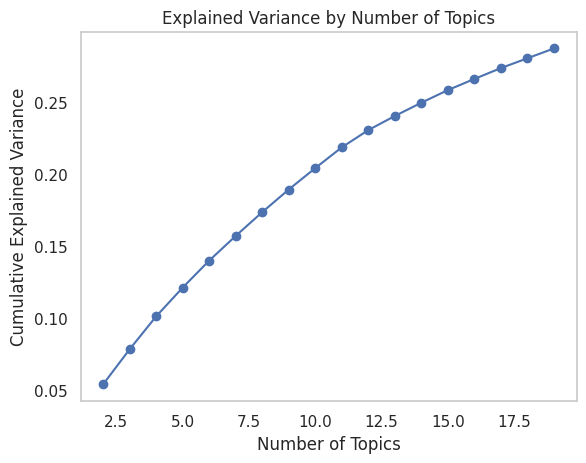

Number of Topics = 2, Explained Variance = 0.0542
Number of Topics = 3, Explained Variance = 0.0786
Number of Topics = 4, Explained Variance = 0.1014
Number of Topics = 5, Explained Variance = 0.1214
Number of Topics = 6, Explained Variance = 0.1401
Number of Topics = 7, Explained Variance = 0.1573
Number of Topics = 8, Explained Variance = 0.1738
Number of Topics = 9, Explained Variance = 0.1895
Number of Topics = 10, Explained Variance = 0.2044
Number of Topics = 11, Explained Variance = 0.2188
Number of Topics = 12, Explained Variance = 0.2308
Number of Topics = 13, Explained Variance = 0.2406
Number of Topics = 14, Explained Variance = 0.2498
Number of Topics = 15, Explained Variance = 0.2586
Number of Topics = 16, Explained Variance = 0.2663
Number of Topics = 17, Explained Variance = 0.2738
Number of Topics = 18, Explained Variance = 0.2807
Number of Topics = 19, Explained Variance = 0.2875


In [67]:
from sklearn.decomposition import TruncatedSVD

# Function to compute the cumulative explained variance for different numbers of topics
def compute_svd_variance(X, start=2, limit=20, step=1):
    explained_variances = []
    components_range = range(start, limit, step)
    
    # Loop over the specified range of components (topics)
    for n_components in components_range:
        # Apply TruncatedSVD with a specified number of components
        svd = TruncatedSVD(n_components=n_components, random_state=42)
        # Fit the model to the data
        svd.fit(X)
        # Append the cumulative explained variance to the list
        explained_variances.append(np.sum(svd.explained_variance_ratio_))
    
    # Return the range of components and the corresponding explained variances
    return components_range, explained_variances

# Define the range of topics (components)
start = 2
limit = 20
step = 1

# Calculate the cumulative explained variance
components_range, explained_variances = compute_svd_variance(X, start, limit, step)

# Plot the explained variance graph
plt.plot(components_range, explained_variances, marker='o')
plt.xlabel('Number of Topics')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Topics')
plt.grid(False)
plt.show()

# Display the explained variance for each number of topics
for n_components, variance in zip(components_range, explained_variances):
    print(f"Number of Topics = {n_components}, Explained Variance = {variance:.4f}")

In [68]:
# LSA Model
# Training the LSA Model (Truncated SVD)

# Set the number of topics
num_topics = 18

# Train the LSA model
lsa_model = TruncatedSVD(n_components=num_topics, random_state=42)
lsa_model.fit(X)

TruncatedSVD(n_components=18, random_state=42)

In [69]:
# Function to display topics with their keywords
def display_topics(model, feature_names, no_top_words):
    # Loop through each topic in the model
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx + 1}:")
        # Get the top words for the current topic based on their weight
        top_words = [feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]
        # Print the top words for the topic
        print(", ".join(top_words))
        print("\n")

# Display the topics with their keywords
no_top_words = 18
feature_names = vectorizer.get_feature_names_out()
display_topics(lsa_model, feature_names, no_top_words)

Topic 1:
headphones, sound, like, apple, don, amazon, kindle, buds, ve, ears, great, people, reviews, use, read, prime, range, nice


Topic 2:
headphones, buds, ears, sound, range, people, earbuds, magnets, apple, don, fall, write, reviews, compare, ve, going, earpods, cord


Topic 3:
earbuds, magnets, headphones, noise, tangle, designed, set, just, ears, cancelling, comfortable, supposed, flat, hate, awesome, really, like, design


Topic 4:
kindle, ipad, hd, year, tablet, hdx, reader, early, magnets, earbuds, model, books, headphones, reading, touch, paperwhite, immediate, secondary


Topic 5:
tap, echo, speaker, great, alexa, love, portable, sound, dot, bluetooth, music, good, button, works, sounds, gift, product, little


Topic 6:
samsung, smartphone, tablets, note, line, background, kindles, like, generation, review, comes, big, way, features, things, products, roku, feel


Topic 7:
early, reader, immediate, secondary, response, reviews, quite, roku, touch, far, tv, friendly, point

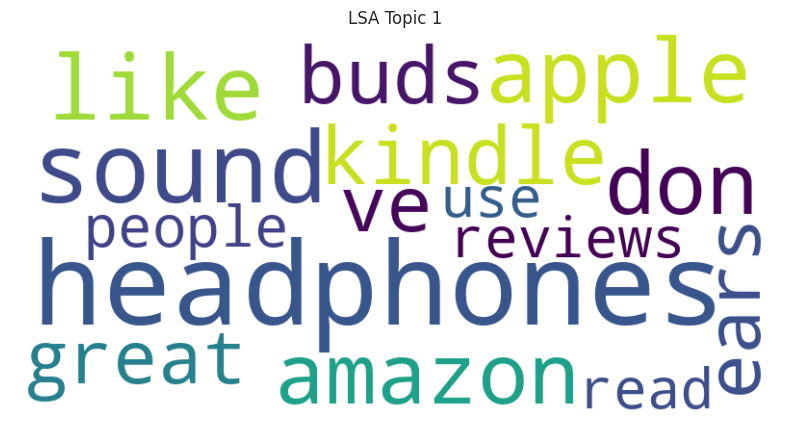

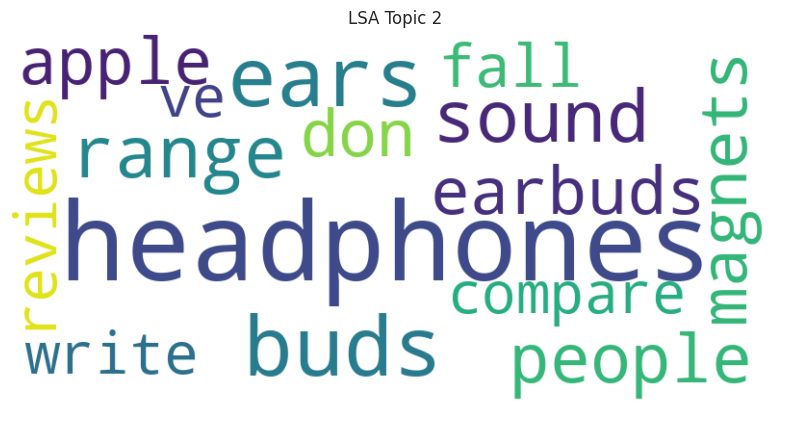

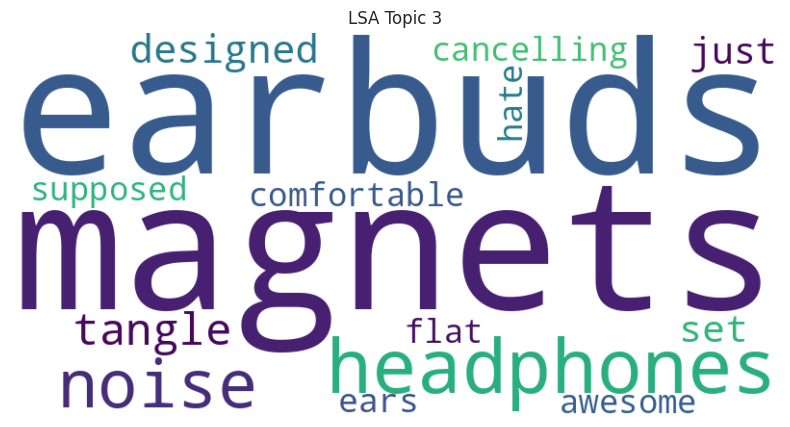

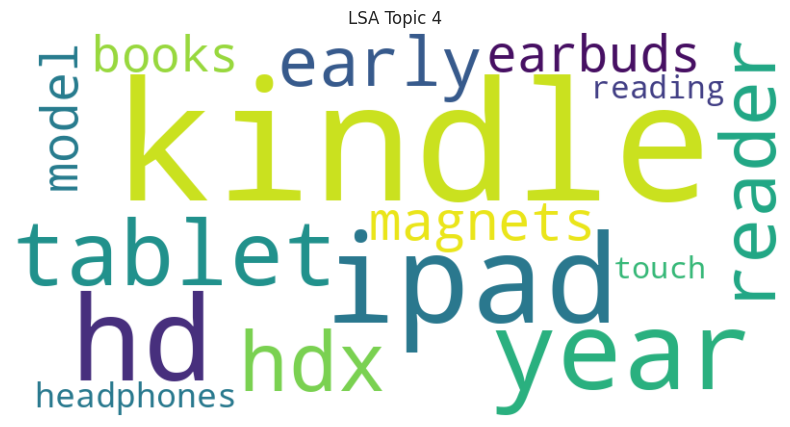

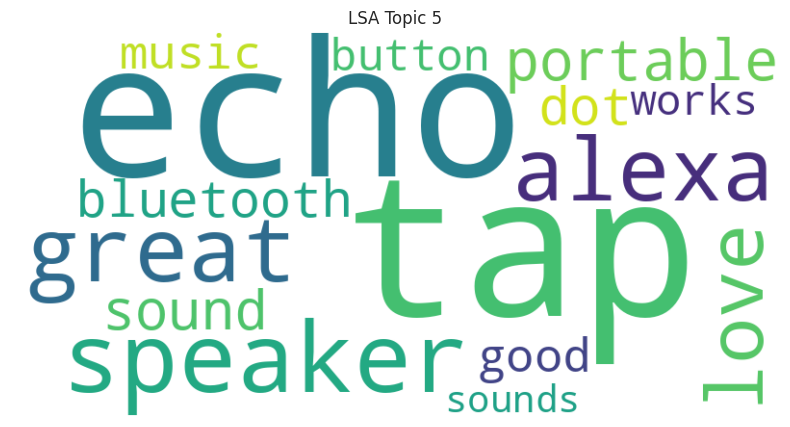

...

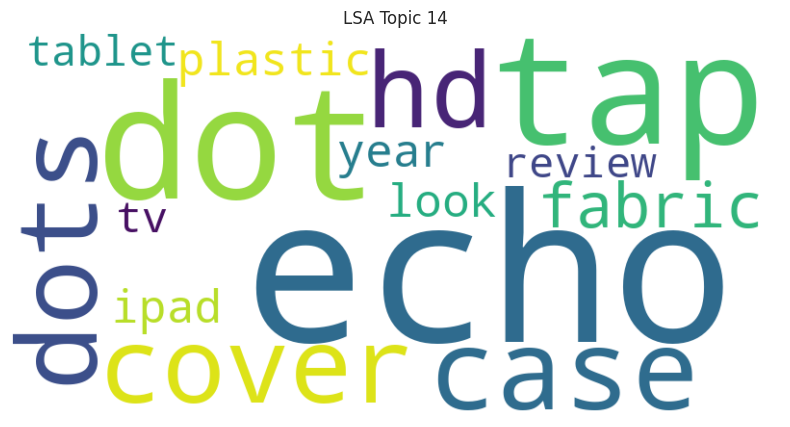

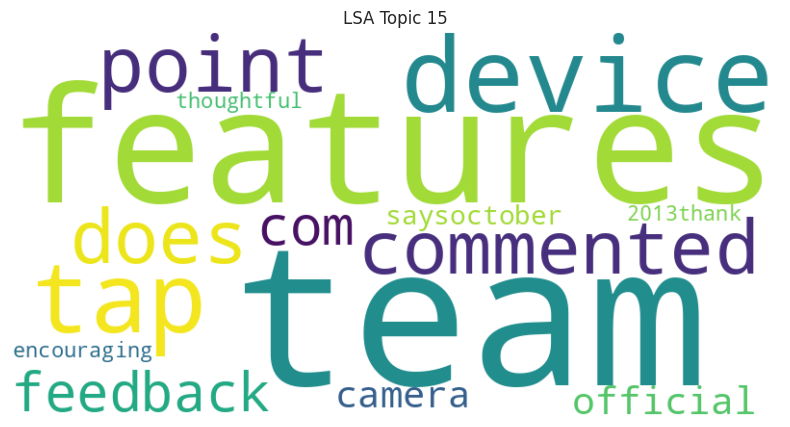

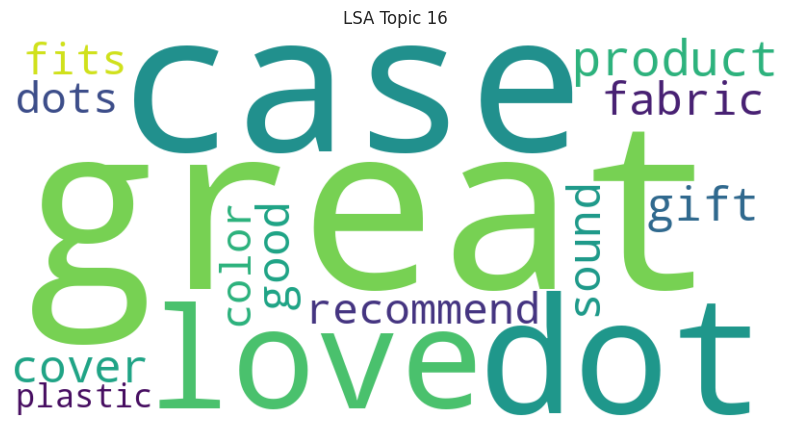

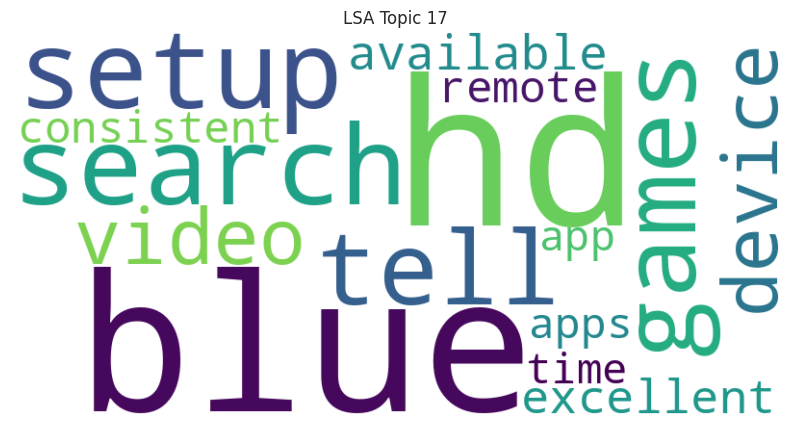

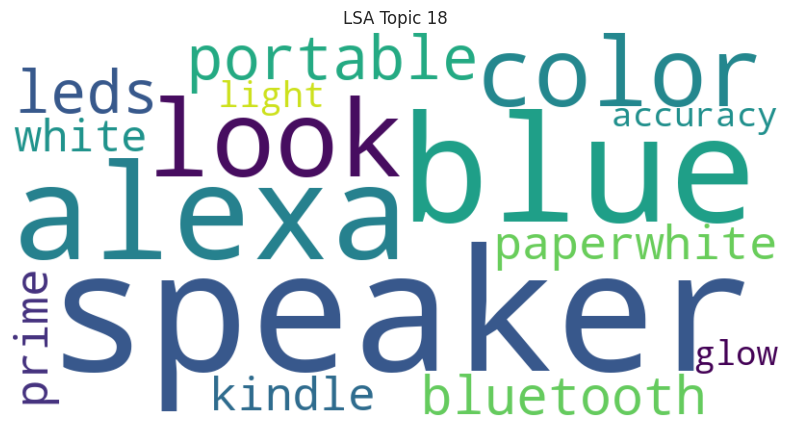

In [70]:
# Function to generate and display a word cloud for a given topic
def plot_wordcloud(model, feature_names, topic_idx, no_top_words=10):
    # Extract the most frequent words from the specified topic
    topic = model.components_[topic_idx]
    top_words = {feature_names[i]: topic[i] for i in topic.argsort()[:-no_top_words - 1:-1]}
    
    # Generate the word cloud from the top words and their frequencies
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_words)
    
    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")  # Remove axis labels for better visualization
    plt.title(f'LSA Topic {topic_idx + 1}')
    plt.show()

# Display word clouds for all topics
feature_names = vectorizer.get_feature_names_out()
for topic_idx in range(num_topics):
    plot_wordcloud(lsa_model, feature_names, topic_idx, no_top_words=15)